In [ ]:
import numpy as np
import pandas as pd
import h5py
import librosa

import matplotlib.pyplot as plt
from matplotlib import image

import os

from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelBinarizer, LabelEncoder
from sklearn.metrics import accuracy_score, r2_score, confusion_matrix, precision_recall_fscore_support, precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import shuffle



from tensorflow.keras.callbacks import EarlyStopping
from random import seed as base_set_seed

from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Conv1D, MaxPooling1D, Flatten, LSTM, SimpleRNN, Reshape, Permute
from keras.utils import to_categorical

from scipy.sparse import csr_matrix

In [2]:
# read in the data
f = h5py.File('bird_spectrograms.hdf5', 'r')
birds = {}
for key in f.keys():
    birds[key] = f[key]
    print(birds[key].shape)
print(birds.keys())

(128, 517, 66)
(128, 517, 172)
(128, 517, 144)
(128, 517, 45)
(128, 517, 125)
(128, 517, 84)
(128, 517, 630)
(128, 517, 37)
(128, 517, 187)
(128, 517, 263)
(128, 517, 137)
(128, 517, 91)
dict_keys(['amecro', 'amerob', 'bewwre', 'bkcchi', 'daejun', 'houfin', 'houspa', 'norfli', 'rewbla', 'sonspa', 'spotow', 'whcspa'])


In [76]:
# pick 10 percent from each bird for initial training of multiclass model
eda_indices = {}
eda_birds = {}
np.random.seed(112358)
# Here some of the imbalance in the species will be preserved for exploring multiclassification model sampling 5% from each bird,
# with a minimum of 10 examples for each bird
for key in birds.keys():
    n_grams = birds[key].shape[2]
    eda_indices[key] = np.sort(np.random.choice(np.arange(0, n_grams), max(int(0.05*n_grams), 10), replace=False))
    eda_birds[key] = birds[key][:, :, eda_indices[key]]
    print(eda_birds[key].shape)


(128, 517, 10)
(128, 517, 10)
(128, 517, 10)
(128, 517, 10)
(128, 517, 10)
(128, 517, 10)
(128, 517, 31)
(128, 517, 10)
(128, 517, 10)
(128, 517, 13)
(128, 517, 10)
(128, 517, 10)


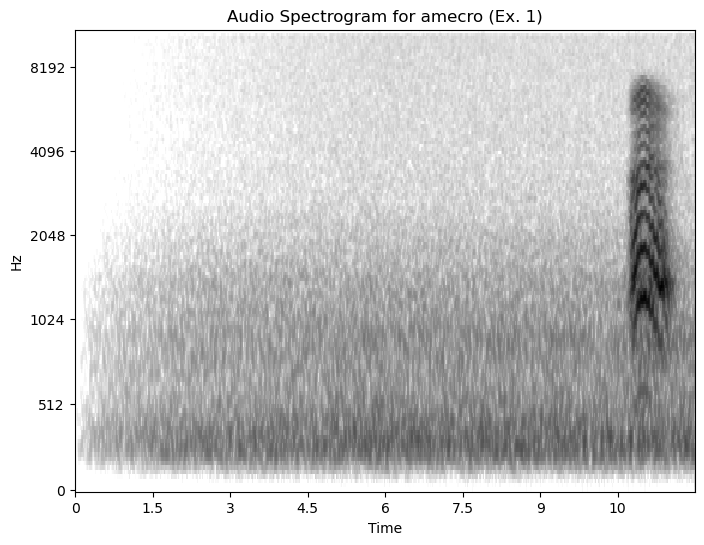

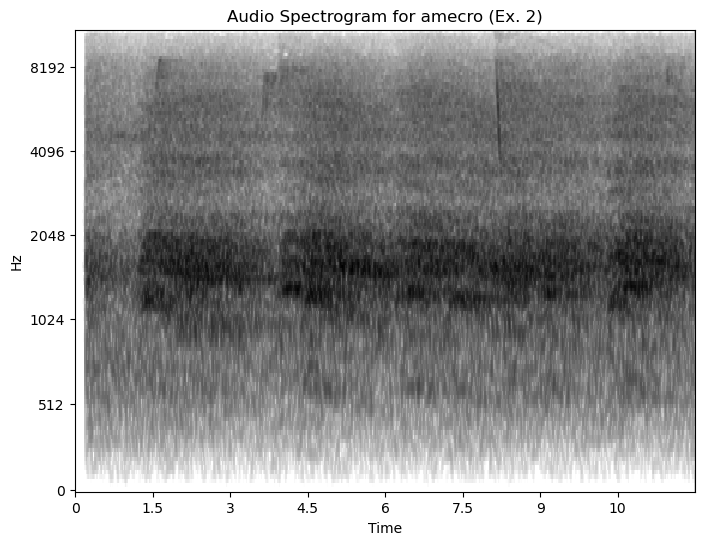

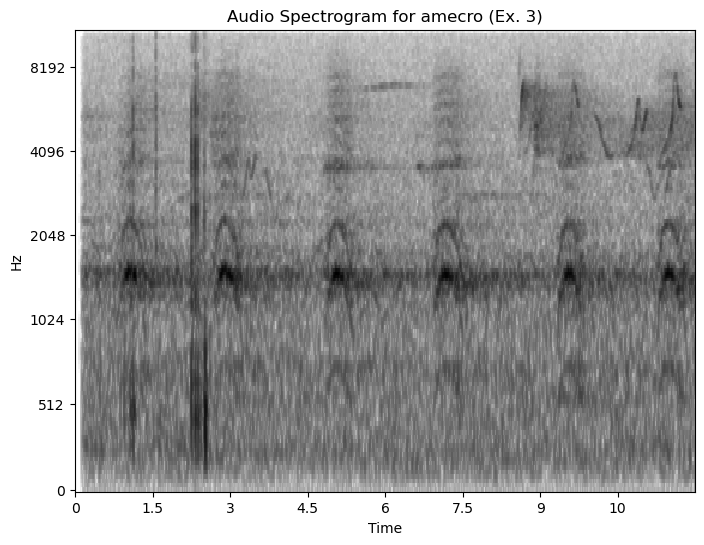

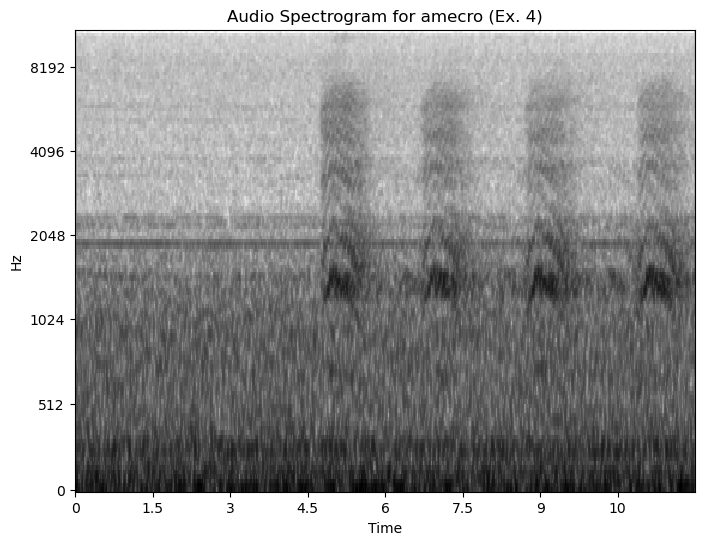

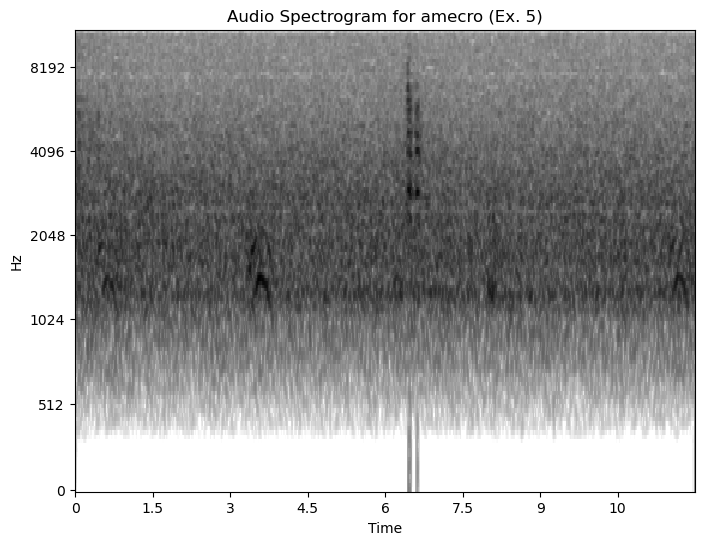

...

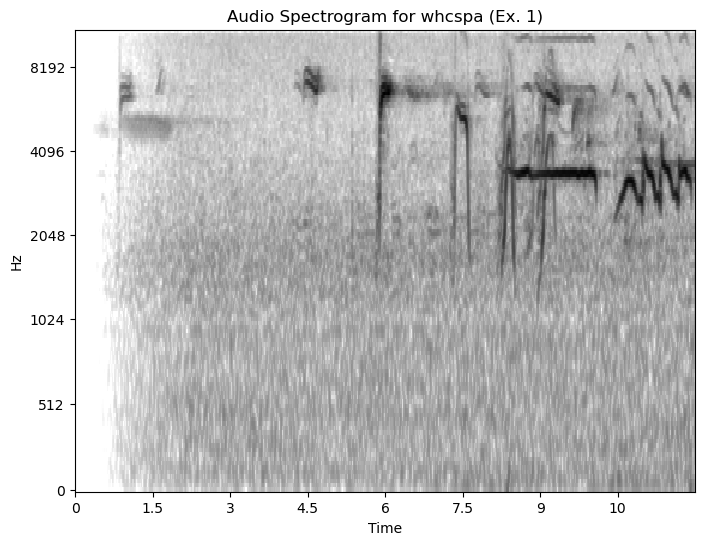

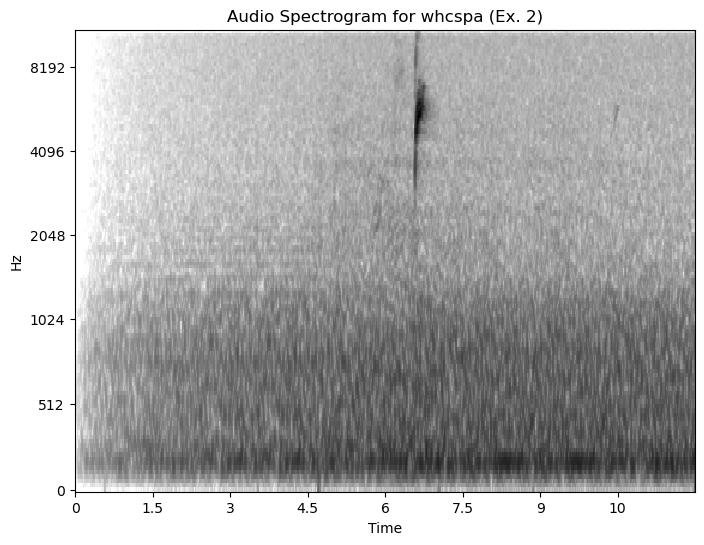

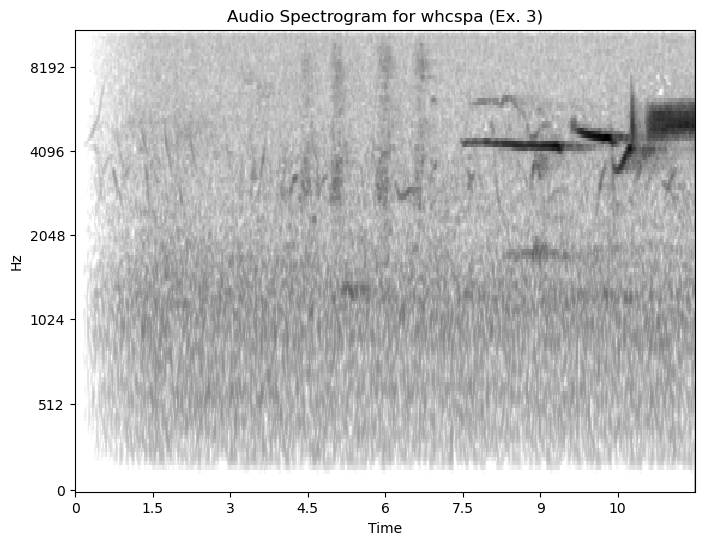

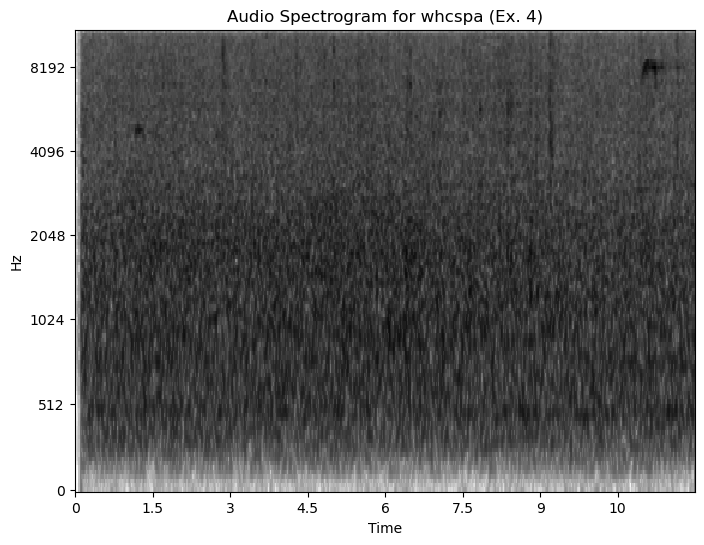

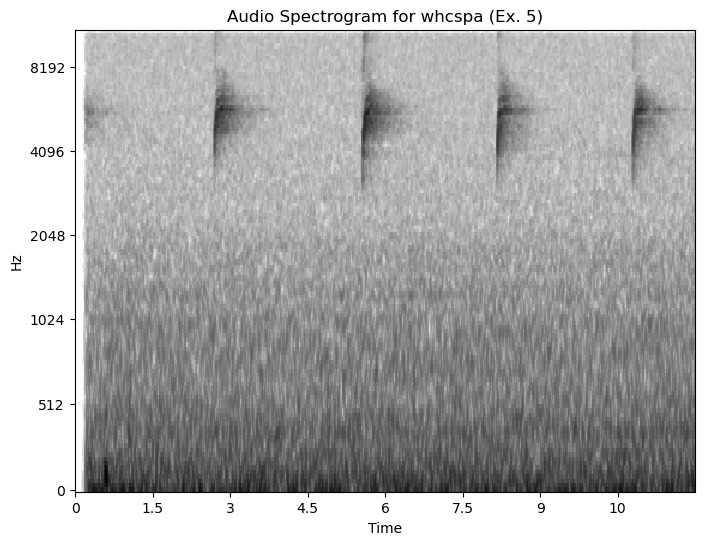

In [42]:
sr = 22050
for key in eda_birds.keys():
    for i in range(5):
        plt.figure(figsize=(8, 6))
        librosa.display.specshow(eda_birds[key][:,:,i], x_axis='time', y_axis='mel', sr=sr, cmap='gray_r')
        plt.title(f'Audio Spectrogram for {key} (Ex. {i+1})')
        plt.show()

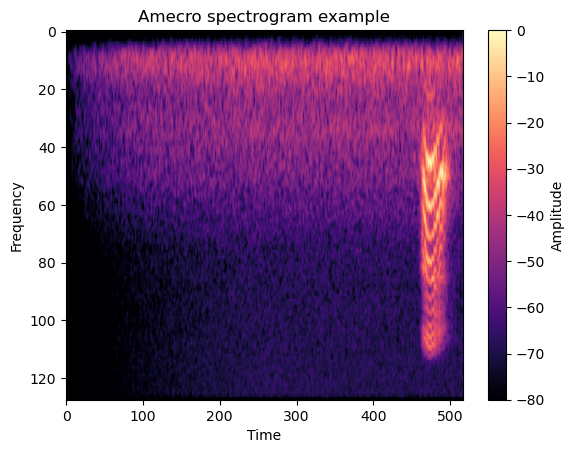

In [5]:
# plot a spectrogram from the american crow
plt.imshow(eda_birds['amecro'][:,:,0], aspect="auto", cmap="magma")
plt.colorbar(label="Amplitude")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.title(f"Amecro spectrogram example")
plt.show()


In [77]:
# combine eda dataset
eda_data_keys = np.array(list(eda_birds.keys()))
eda_data_full = np.concatenate([birds[key] for key in eda_data_keys], axis=-1)
eda_data_labels_full = np.concatenate([np.full(birds[key].shape[-1], ind) for (ind, key) in enumerate(eda_data_keys)])
eda_data = np.concatenate([eda_birds[key] for key in eda_data_keys], axis=-1)
eda_data_labels = np.concatenate([np.full(eda_birds[key].shape[-1], ind) for (ind, key) in enumerate(eda_data_keys)])

def labelsToBirds(labels):
    return eda_data_keys[labels]

In [45]:
# pick a sample for training and validation for full data set
n_eda_samples = eda_data_full.shape[-1]
test_prop = 0.2
fulldata_train_idx, fulldata_test_idx = train_test_split(np.arange(0, eda_data_full.shape[-1]), test_size=test_prop, random_state=112358)

full_train_data = np.transpose(eda_data_full[:,:, fulldata_train_idx], (2, 0, 1)).reshape(-1, 128, 517, 1) # reshape and add single channel for cnn
full_train_labels = to_categorical(eda_data_labels_full[fulldata_train_idx], 12)
full_train_data, full_train_labels = shuffle(full_train_data, full_train_labels, random_state=112358)
full_test_data = np.transpose(eda_data_full[:,:, fulldata_test_idx], (2, 0, 1)).reshape(-1, 128, 517, 1)
full_test_labels = to_categorical(eda_data_labels_full[fulldata_test_idx], 12)
full_test_data, full_test_labels = shuffle(full_test_data, full_test_labels, random_state=112358)
print(full_test_labels.shape)
print(full_train_labels.shape)
print(full_test_labels[0])

# create weights for training loss relative to response class imbalance
fulldata_class_weights = compute_class_weight(class_weight="balanced", 
                                     classes=np.unique(eda_data_labels_full[fulldata_train_idx], axis=0), 
                                     y=eda_data_labels_full[fulldata_train_idx])
fulldata_class_weight_dict = {i: fulldata_class_weights[i] for i in range(len(fulldata_class_weights))}

print(fulldata_class_weight_dict)

(397, 12)
(1584, 12)
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
{0: np.float64(2.4), 1: np.float64(0.9428571428571428), 2: np.float64(1.1785714285714286), 3: np.float64(3.3), 4: np.float64(1.375), 5: np.float64(2.0307692307692307), 6: np.float64(0.26294820717131473), 7: np.float64(4.551724137931035), 8: np.float64(0.8859060402684564), 9: np.float64(0.616822429906542), 10: np.float64(1.2), 11: np.float64(1.8333333333333333)}


In [78]:
# pick a sample for training and validation
n_eda_samples = eda_data.shape[-1]
test_prop = 0.2
train_indices, test_indices = train_test_split(np.arange(0, eda_data.shape[-1]), test_size=test_prop, random_state=112358)

train_data = np.transpose(eda_data[:,:, train_indices], (2, 0, 1)).reshape(-1, 128, 517, 1) # reshape and add single channel for cnn
train_labels = to_categorical(eda_data_labels[train_indices], 12)
test_data = np.transpose(eda_data[:,:, test_indices], (2, 0, 1)).reshape(-1, 128, 517, 1)
test_labels = to_categorical(eda_data_labels[test_indices], 12)
print(test_labels.shape)
print(train_labels.shape)
print(test_labels[0])

# create weights for training loss relative to response class imbalance
class_weights = compute_class_weight(class_weight="balanced", 
                                     classes=np.unique(eda_data_labels[train_indices], axis=0), 
                                     y=eda_data_labels[train_indices])
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

print(class_weight_dict)


(29, 12)
(115, 12)
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
{0: np.float64(1.0648148148148149), 1: np.float64(1.369047619047619), 2: np.float64(1.1979166666666667), 3: np.float64(1.1979166666666667), 4: np.float64(0.9583333333333334), 5: np.float64(1.369047619047619), 6: np.float64(0.45634920634920634), 7: np.float64(1.0648148148148149), 8: np.float64(1.1979166666666667), 9: np.float64(0.7986111111111112), 10: np.float64(1.1979166666666667), 11: np.float64(1.1979166666666667)}


In [8]:
# try a simple neural network with a hidden layer or two and dropout regularization

In [ ]:
# try using some convolutional and pooling layers, still treating the spectrograms like a 2d image
# initial input shape: 128 by 517

# for an audio spectrogram, we might be interested in rectangular kernels that focus on either time variation or 
# frequency variation
conv_width = 3
conv_height = 3 
pool_width = 2
dropout_rate = 0.3

model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(conv_height, conv_width), padding='same', activation='relu', input_shape=(128,517, 1)),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=64, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=128, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=256, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Flatten(),
    Dropout(rate=dropout_rate),
    Dense(units=512, activation='relu'),
    Dense(units=12, activation='softmax') # 12 bird species
    ])

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True
)
print(model_cnn.summary())

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
%%time
# try on full data set


batch_size = 200 # works ok with ~1600 train examples

model_cnn.compile(loss='categorical_crossentropy',
                optimizer='rmsprop',
                metrics=['accuracy'])

history_cnn_fulldata = model_cnn.fit(full_train_data, full_train_labels,
                        epochs=75,
                        batch_size=batch_size,
                        validation_data=(full_test_data, full_test_labels),
                        verbose=1,
                        class_weight=fulldata_class_weight_dict)
                        #callbacks=[early_stopping])


Epoch 1/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - accuracy: 0.1857 - loss: 13.9270 - val_accuracy: 0.1008 - val_loss: 2.5425
Epoch 2/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 34s 4s/step - accuracy: 0.1408 - loss: 2.3883 - val_accuracy: 0.1990 - val_loss: 2.3737
Epoch 3/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 38s 5s/step - accuracy: 0.2626 - loss: 1.9876 - val_accuracy: 0.3577 - val_loss: 2.0984
Epoch 4/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 38s 5s/step - accuracy: 0.4409 - loss: 1.5618 - val_accuracy: 0.2771 - val_loss: 2.3033
Epoch 5/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 37s 5s/step - accuracy: 0.5470 - loss: 1.1760 - val_accuracy: 0.4005 - val_loss: 2.1168
Epoch 6/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 38s 5s/step - accuracy: 0.6237 - loss: 0.9143 - val_accuracy: 0.3552 - val_loss: 2.3220
Epoch 7/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 40s 5s/step - accuracy: 0.7064 - loss: 0.6362 - val_accuracy: 0.3627 - val_loss: 2.2622
Epoch 8/75
8/8 ━━━━━━━━━━━━━━━━━━━━ 38s 5s/step - accuracy: 0.7773 - loss: 0.5260 - val_accuracy: 0.4282 - val_loss: 2.2247
Epoch 9

NameError: name 'model_cnn_fulldata' is not defined

In [48]:

test_pred = model_cnn.predict(full_test_data)

y_true_classes = np.argmax(full_test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step
Test Accuracy: 46.35%
Average Test Precision: 0.419
Average Test Recall: 0.372
Average Test F1-score: 0.362


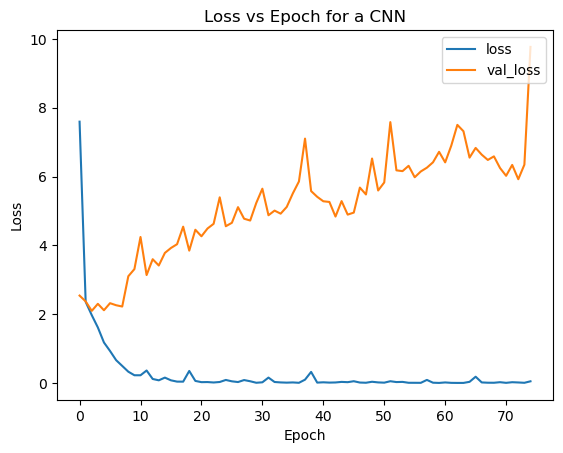

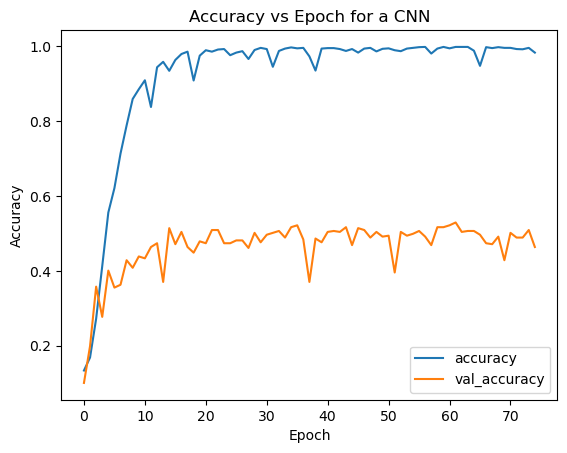

In [50]:
plt.plot(history_cnn_fulldata.history['loss'])
plt.plot(history_cnn_fulldata.history['val_loss'])
plt.title('Loss vs Epoch for a CNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_cnn_fulldata.history['accuracy'])
plt.plot(history_cnn_fulldata.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a CNN')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

In [ ]:
%%time

batch_size = 30 # works of with ~170 train examples

model_cnn.compile(loss='categorical_crossentropy',
                optimizer='rmsprop',
                metrics=['accuracy'])

history_cnn = model_cnn.fit(train_data, train_labels,
                        epochs=50,
                        batch_size=batch_size,
                        validation_data=(test_data, test_labels),
                        verbose=1,
                        class_weight=class_weight_dict)
                        #callbacks=[early_stopping])

test_pred = model_cnn.predict(test_data)

y_true_classes = np.argmax(test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 569ms/step - accuracy: 0.0780 - loss: 92.7090 - val_accuracy: 0.1163 - val_loss: 2.5369
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 519ms/step - accuracy: 0.0572 - loss: 2.7760 - val_accuracy: 0.0698 - val_loss: 2.4770
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 501ms/step - accuracy: 0.1414 - loss: 2.4274 - val_accuracy: 0.0465 - val_loss: 2.6607
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 502ms/step - accuracy: 0.0666 - loss: 2.4814 - val_accuracy: 0.0698 - val_loss: 2.4864
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 503ms/step - accuracy: 0.0726 - loss: 2.5729 - val_accuracy: 0.0465 - val_loss: 2.6081
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 498ms/step - accuracy: 0.1008 - loss: 3.1258 - val_accuracy: 0.0930 - val_loss: 2.5377
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 503ms/step - accuracy: 0.1072 - loss: 2.6995 - val_accuracy: 0.0930 - val_loss: 2.3928
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 504ms/step - accuracy: 0.1612 - loss: 2.4057 - val_accuracy: 0.1395 - 

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


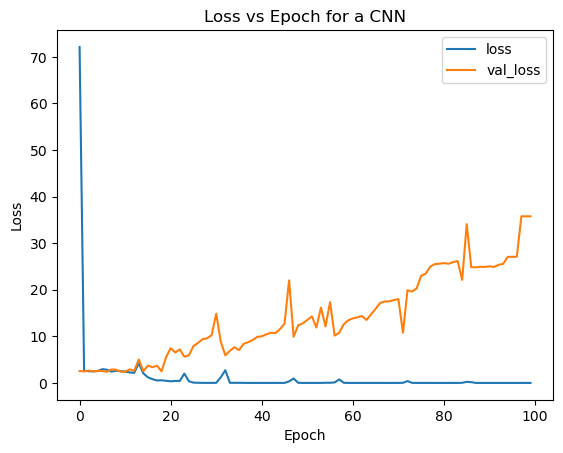

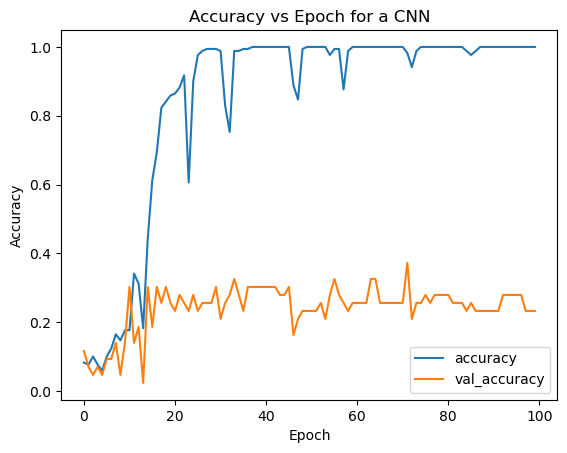

In [11]:
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('Loss vs Epoch for a CNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_cnn.history['accuracy'])
plt.plot(history_cnn.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a CNN')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

In [12]:
print(y_true_classes)
print(y_pred_classes)
print(eda_data_keys[6])

[10  2  6  8  6  9  1  6  7  6  8  6  1  6  3  8  8  5  5  9  8  6  6  2
  8  8 10  1  1  6  6  6  9  1  2  9  2  9  4  6  7  6  4]
[ 2  6  5  1  1  9  3  5  7  6  9  9  9  3  8  6  8  6  6 11  6  6  3 11
  9  9  1  1  6 10  9  6  3  6  6  7  8  9 11  8  6  6  4]
houspa


In [28]:
# try using a recurrent neural network on the amplitude vector for each moment in time
# input shape: 128

# Define model
dropout_rate = 0.3
model_rnn = Sequential([
    LSTM(64, return_sequences=True, input_shape=(517, 128)),
    Dropout(dropout_rate),
    LSTM(128),
    Dense(512, activation="relu"),
    Dropout(dropout_rate),
    Dense(12, activation="softmax")  # Final output (12 classes)
])

# Compile model
model_rnn.compile(
    optimizer="rmsprop",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print(model_rnn.summary())

# reshape/reformat inputs
train_data = np.transpose(eda_data[:,:, train_indices], (2, 1, 0))
train_labels = to_categorical(eda_data_labels[train_indices], 12)
test_data = np.transpose(eda_data[:,:, test_indices], (2, 1, 0))
test_labels = to_categorical(eda_data_labels[test_indices], 12)

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_7 (LSTM)                   │ (None, 517, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 517, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_8 (LSTM)                   │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 220,428 (861.05 KB)

 Trainable params: 220,428 (861.05 KB)

 Non-trainable params: 0 (0.00 B)

None


In [29]:
history_rnn = model_rnn.fit(train_data, train_labels, validation_data=(test_data, test_labels),
    batch_size=batch_size,
    epochs=100,
    class_weight=class_weight_dict)
    #callbacks=[early_stopping])

test_pred = model_rnn.predict(test_data)

y_true_classes = np.argmax(test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 301ms/step - accuracy: 0.0382 - loss: 2.5099 - val_accuracy: 0.1163 - val_loss: 2.4965
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - accuracy: 0.0622 - loss: 2.5183 - val_accuracy: 0.0465 - val_loss: 2.4849
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 245ms/step - accuracy: 0.1187 - loss: 2.3908 - val_accuracy: 0.0233 - val_loss: 2.5162
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 272ms/step - accuracy: 0.1161 - loss: 2.5134 - val_accuracy: 0.0465 - val_loss: 2.4154
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - accuracy: 0.0868 - loss: 2.4987 - val_accuracy: 0.0465 - val_loss: 2.4534
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - accuracy: 0.1255 - loss: 2.5056 - val_accuracy: 0.0698 - val_loss: 2.4753
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - accuracy: 0.1206 - loss: 2.4498 - val_accuracy: 0.1163 - val_loss: 2.4244
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - accuracy: 0.0682 - loss: 2.4863 - val_accuracy: 0.0930 - v

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


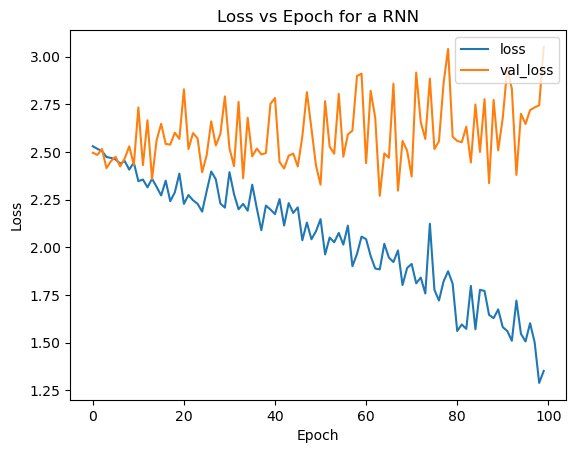

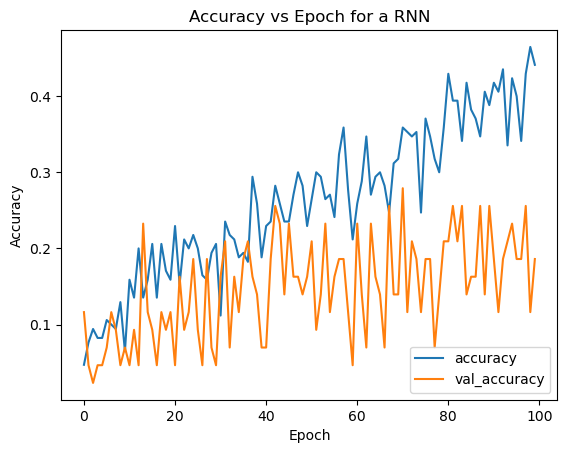

In [30]:
plt.plot(history_rnn.history['loss'])
plt.plot(history_rnn.history['val_loss'])
plt.title('Loss vs Epoch for a RNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_rnn.history['accuracy'])
plt.plot(history_rnn.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a RNN')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

In [16]:
y_pred_classes

array([10,  8,  1,  3,  3,  2,  3,  8,  3,  3,  5,  9,  9,  9,  1, 10,  5,
        3,  6,  3,  2,  3,  9,  2,  2,  9,  3,  6, 10,  3,  3,  6, 10,  3,
        8,  9,  9,  3,  2,  2,  6,  2, 10])

In [19]:
# try adding a 1d convolutional filter to the RNN beforehand
# Define model without pooling first
dropout_rate = 0.5
model_conv_rnn = Sequential([
    Conv1D(filters=64, kernel_size=3, input_shape=(517,128)),
    LSTM(64, return_sequences=True),
    Dropout(dropout_rate),
    LSTM(128),
    Dense(512, activation="relu"),
    Dense(12, activation="softmax")  # Final output (12 classes)
])

# Compile model
model_conv_rnn.compile(
    optimizer="rmsprop",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print(model_conv_rnn.summary())

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 515, 64)        │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 515, 64)        │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 515, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 228,684 (893.30 KB)

 Trainable params: 228,684 (893.30 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
history_conv_rnn = model_conv_rnn.fit(train_data, train_labels, validation_data=(test_data, test_labels),
    batch_size=batch_size,
    epochs=100,
    class_weight=class_weight_dict)
    #callbacks=[early_stopping])

test_pred = model_conv_rnn.predict(test_data)

y_true_classes = np.where(test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 293ms/step - accuracy: 0.0773 - loss: 2.4930 - val_accuracy: 0.0465 - val_loss: 2.4753
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.0424 - loss: 2.4990 - val_accuracy: 0.1163 - val_loss: 2.4744
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - accuracy: 0.0573 - loss: 2.5670 - val_accuracy: 0.0930 - val_loss: 2.4587
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 240ms/step - accuracy: 0.0473 - loss: 2.4481 - val_accuracy: 0.1628 - val_loss: 2.4877
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - accuracy: 0.0587 - loss: 2.5303 - val_accuracy: 0.0698 - val_loss: 2.4599
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - accuracy: 0.0484 - loss: 2.4697 - val_accuracy: 0.0465 - val_loss: 2.5085
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - accuracy: 0.0428 - loss: 2.4395 - val_accuracy: 0.0465 - val_loss: 2.4894
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 274ms/step - accuracy: 0.1157 - loss: 2.3349 - val_accuracy: 0.0000e+00

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


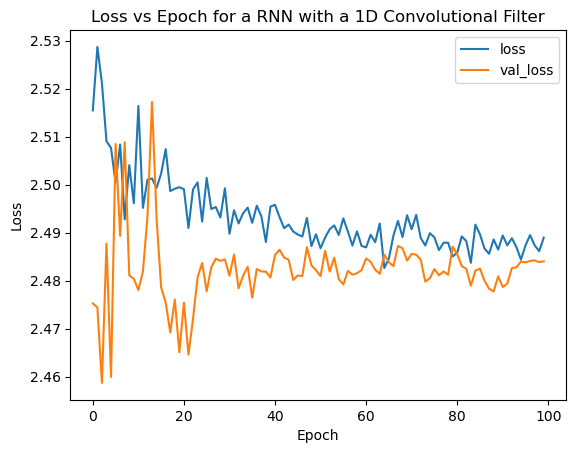

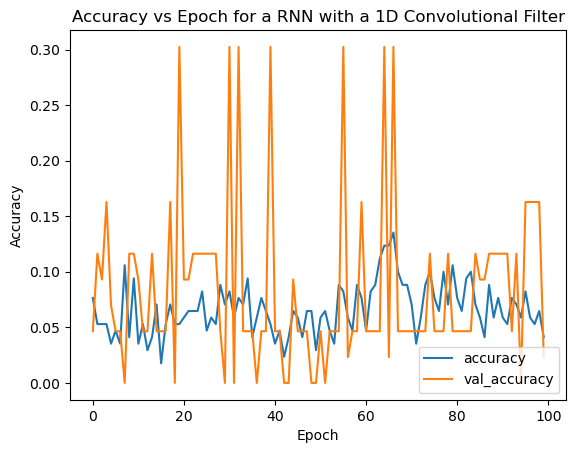

In [22]:
plt.plot(history_conv_rnn.history['loss'])
plt.plot(history_conv_rnn.history['val_loss'])
plt.title('Loss vs Epoch for a RNN with a 1D Convolutional Filter')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_conv_rnn.history['accuracy'])
plt.plot(history_conv_rnn.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a RNN with a 1D Convolutional Filter')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

In [32]:
# try a simple lstm for comparison
dropout_rate = 0.3
model_single_lstm = Sequential([
    LSTM(128, input_shape=(517, 128)),
    Dropout(dropout_rate),
    Dense(512, activation="relu"),
    Dense(12, activation="softmax")  # Final output (12 classes)
])

# Compile model
model_single_lstm.compile(
    optimizer="rmsprop",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print(model_single_lstm.summary())


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 203,788 (796.05 KB)

 Trainable params: 203,788 (796.05 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
history_single_lstm = model_single_lstm.fit(train_data, train_labels, validation_data=(test_data, test_labels),
    batch_size=batch_size,
    epochs=100,
    class_weight=class_weight_dict)
    #callbacks=[early_stopping])

test_pred = model_single_lstm.predict(test_data)


Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.1254 - loss: 2.3575 - val_accuracy: 0.0698 - val_loss: 2.5052
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.1368 - loss: 2.2519 - val_accuracy: 0.0930 - val_loss: 2.5702
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.1629 - loss: 2.3061 - val_accuracy: 0.1163 - val_loss: 2.5655
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - accuracy: 0.1656 - loss: 2.2513 - val_accuracy: 0.0465 - val_loss: 2.5019
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.1803 - loss: 2.2650 - val_accuracy: 0.1163 - val_loss: 2.5860
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.1749 - loss: 2.3012 - val_accuracy: 0.0698 - val_loss: 2.4755
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - accuracy: 0.1350 - loss: 2.2926 - val_accuracy: 0.0000e+00 - val_loss: 2.8231
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - accuracy: 0.1153 - loss: 2.3271 - val_accuracy: 0.0698

ValueError: Found input variables with inconsistent numbers of samples: [1, 43]

In [36]:

y_true_classes = np.argmax(test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

Test Accuracy: 11.63%
Average Test Precision: 0.046
Average Test Recall: 0.094
Average Test F1-score: 0.055


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [37]:
print(y_true_classes)

[10  2  6  8  6  9  1  6  7  6  8  6  1  6  3  8  8  5  5  9  8  6  6  2
  8  8 10  1  1  6  6  6  9  1  2  9  2  9  4  6  7  6  4]


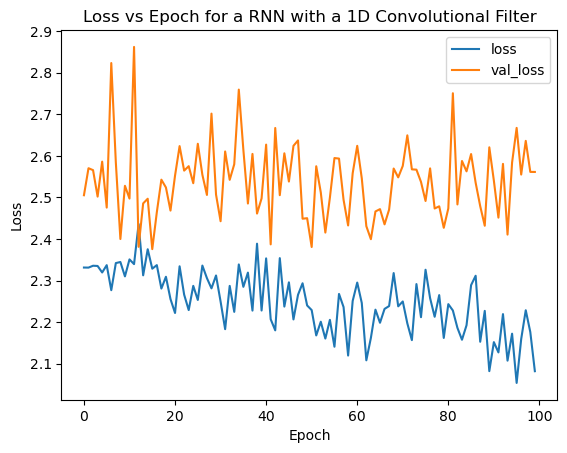

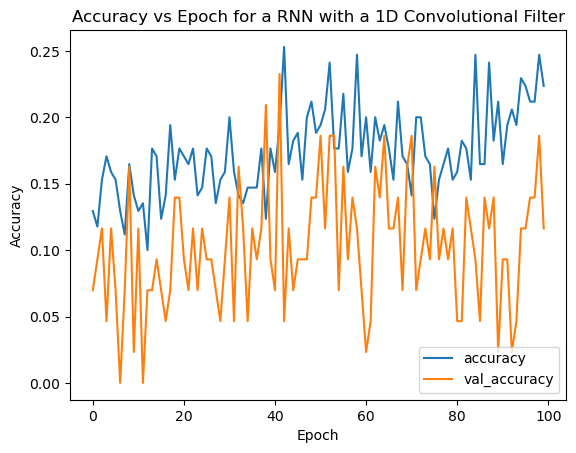

In [38]:
plt.plot(history_single_lstm.history['loss'])
plt.plot(history_single_lstm.history['val_loss'])
plt.title('Loss vs Epoch for a RNN with a 1D Convolutional Filter')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_single_lstm.history['accuracy'])
plt.plot(history_single_lstm.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a RNN with a 1D Convolutional Filter')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

### more exploration with the convolutional model
The best results so far have come from treating the spectrograms like an image and using a convolutional neural network. The results from attempting to use a recurrent network have not been promising. As a result, further exploration of the parameters for the convolutional model will be conducted. A model which uses a lstm network to 

In [ ]:
train_data = np.transpose(eda_data[:,:, train_indices], (2, 0, 1)).reshape(-1, 128, 517, 1) # reshape and add single channel for cnn
train_labels = to_categorical(eda_data_labels[train_indices], 12)
test_data = np.transpose(eda_data[:,:, test_indices], (2, 0, 1)).reshape(-1, 128, 517, 1)
test_labels = to_categorical(eda_data_labels[test_indices], 12)
print(test_labels.shape)
print(train_labels.shape)
print(test_labels[0])

# create weights for training loss relative to response class imbalance
class_weights = compute_class_weight(class_weight="balanced", 
                                     classes=np.unique(eda_data_labels[train_indices], axis=0), 
                                     y=eda_data_labels[train_indices])
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

print(class_weight_dict)

In [61]:
conv_width = 3
conv_height = 3 
pool_width = 2
dropout_rate = 0.3

model_cnn = Sequential(
    [
    Conv2D(filters=32, kernel_size=(conv_height, conv_width), padding='same', activation='relu', input_shape=(128,517, 1)),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=64, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=128, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    Conv2D(filters=256, kernel_size=(conv_height, conv_width), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(pool_width, pool_width)),
    #Flatten(),
    Permute((2, 1, 3)),
    Reshape((32, 8*256)),
    LSTM(128),
    Dropout(rate=dropout_rate),
    Dense(units=512, activation='relu'),
    Dense(units=12, activation='softmax') # 12 bird species
    ])

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True
)
print(model_cnn.summary())

train_data = np.transpose(eda_data[:,:, train_indices], (2, 0, 1)).reshape(-1, 128, 517, 1) # reshape and add single channel for cnn
train_labels = to_categorical(eda_data_labels[train_indices], 12)
test_data = np.transpose(eda_data[:,:, test_indices], (2, 0, 1)).reshape(-1, 128, 517, 1)
test_labels = to_categorical(eda_data_labels[test_indices], 12)
print(test_labels.shape)
print(train_labels.shape)
print(test_labels[0])

# create weights for training loss relative to response class imbalance
class_weights = compute_class_weight(class_weight="balanced", 
                                     classes=np.unique(eda_data_labels[train_indices], axis=0), 
                                     y=eda_data_labels[train_indices])
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

print(class_weight_dict)

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_36 (Conv2D)              │ (None, 128, 517, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 64, 258, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (None, 64, 258, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 32, 129, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_38 (Conv2D)              │ (None, 32, 129, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 16, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_39 (Conv2D)              │ (None, 16, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 8, 32, 256)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ permute_3 (Permute)             │ (None, 32, 8, 256)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_4 (Reshape)             │ (None, 32, 2048)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 128)            │     1,114,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 12)             │         6,156 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,574,668 (6.01 MB)

 Trainable params: 1,574,668 (6.01 MB)

 Non-trainable params: 0 (0.00 B)

None
(43, 12)
(170, 12)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
{0: np.float64(1.4166666666666667), 1: np.float64(1.1805555555555556), 2: np.float64(1.4166666666666667), 3: np.float64(1.5740740740740742), 4: np.float64(1.4166666666666667), 5: np.float64(1.7708333333333333), 6: np.float64(0.2833333333333333), 7: np.float64(1.7708333333333333), 8: np.float64(1.2878787878787878), 9: np.float64(0.6746031746031746), 10: np.float64(1.2878787878787878), 11: np.float64(1.4166666666666667)}


In [62]:
%%time

batch_size = 30 # works of with ~170 train examples

model_cnn.compile(loss='categorical_crossentropy',
                optimizer='rmsprop',
                metrics=['accuracy'])

history_cnn = model_cnn.fit(train_data, train_labels,
                        epochs=75,
                        batch_size=batch_size,
                        validation_data=(test_data, test_labels),
                        verbose=1,
                        class_weight=class_weight_dict)
                        #callbacks=[early_stopping])

test_pred = model_cnn.predict(test_data)

y_true_classes = np.argmax(test_labels, axis=1)
y_pred_classes = np.argmax(test_pred, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, y_pred_classes, average='macro')

print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Average Test Precision: {precision:.3f}")
print(f"Average Test Recall: {recall:.3f}")
print(f"Average Test F1-score: {f1:.3f}")

Epoch 1/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 556ms/step - accuracy: 0.0389 - loss: 2.6377 - val_accuracy: 0.0465 - val_loss: 2.4849
Epoch 2/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 463ms/step - accuracy: 0.0552 - loss: 2.6948 - val_accuracy: 0.1163 - val_loss: 2.4616
Epoch 3/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 462ms/step - accuracy: 0.0859 - loss: 2.5383 - val_accuracy: 0.1163 - val_loss: 2.4942
Epoch 4/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 454ms/step - accuracy: 0.0429 - loss: 2.5627 - val_accuracy: 0.0465 - val_loss: 2.4644
Epoch 5/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 461ms/step - accuracy: 0.0585 - loss: 2.5520 - val_accuracy: 0.0465 - val_loss: 2.5004
Epoch 6/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 474ms/step - accuracy: 0.0986 - loss: 2.3706 - val_accuracy: 0.0930 - val_loss: 2.5060
Epoch 7/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 482ms/step - accuracy: 0.0517 - loss: 2.5738 - val_accuracy: 0.1163 - val_loss: 2.5161
Epoch 8/75
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 477ms/step - accuracy: 0.0568 - loss: 2.4909 - val_accuracy: 0.1163 - val_loss:

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


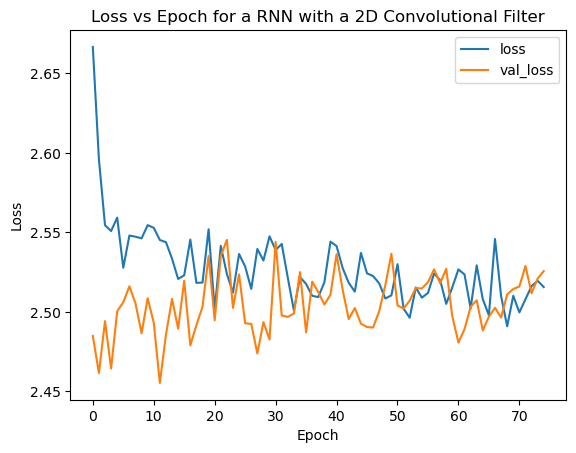

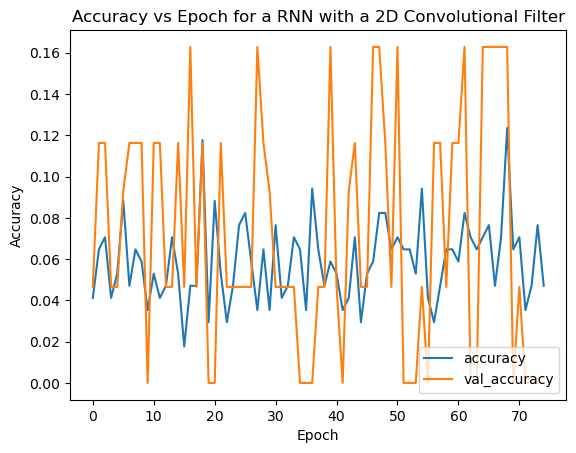

In [64]:
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('Loss vs Epoch for a RNN with a 2D Convolutional Filter')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['loss', 'val_loss'], loc='upper right')
plt.show()

plt.plot(history_cnn.history['accuracy'])
plt.plot(history_cnn.history['val_accuracy'])
plt.title('Accuracy vs Epoch for a RNN with a 2D Convolutional Filter')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
plt.show()

(18, 3)
Training model 1...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


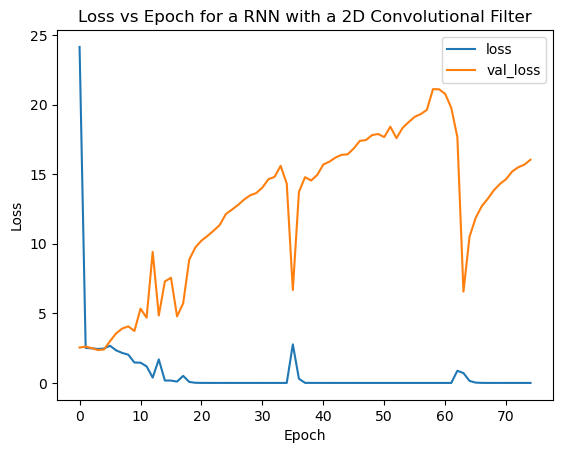

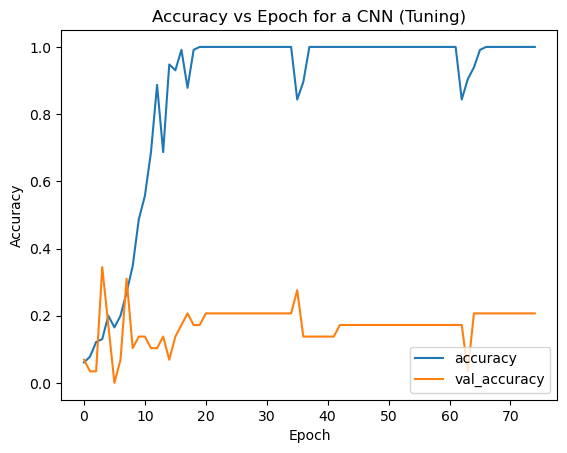

Best epoch: 36, Validation Accuracy: 0.2759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
Test Accuracy: 20.69%
Average Test Precision: 0.034
Average Test Recall: 0.055
Average Test F1-score: 0.042
Training model 2...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


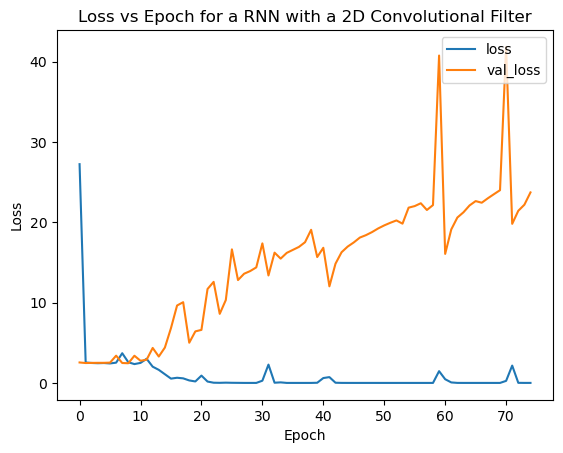

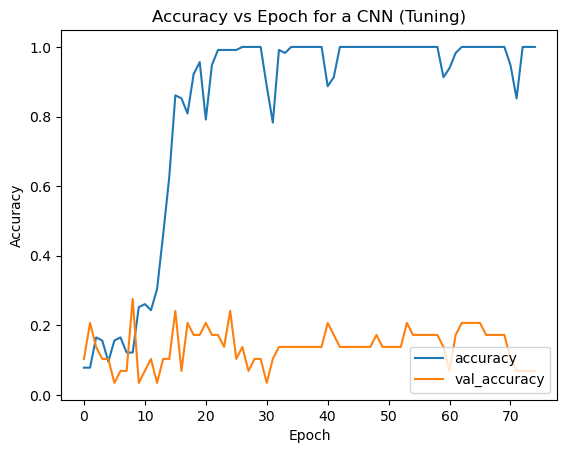

Best epoch: 25, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.038
Average Test Recall: 0.042
Average Test F1-score: 0.040
Training model 3...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

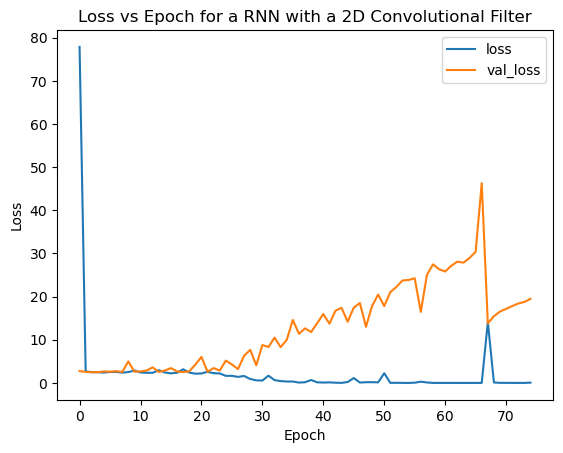

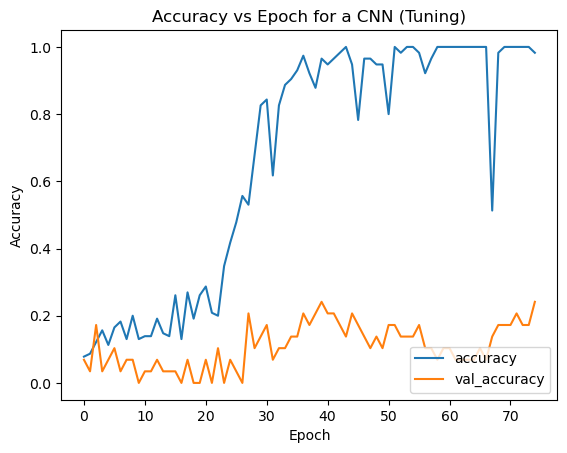

Best epoch: 40, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.038
Average Test Recall: 0.042
Average Test F1-score: 0.040
Training model 4...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

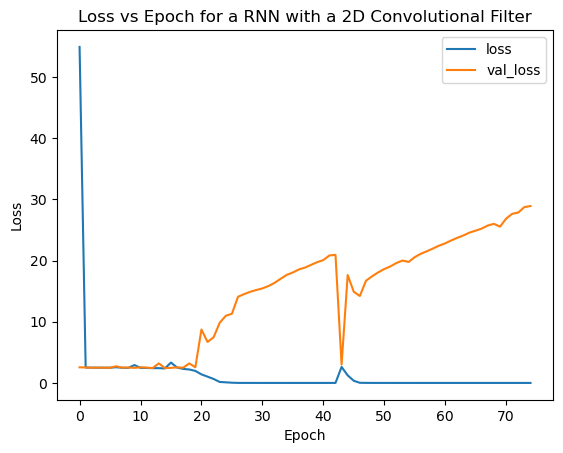

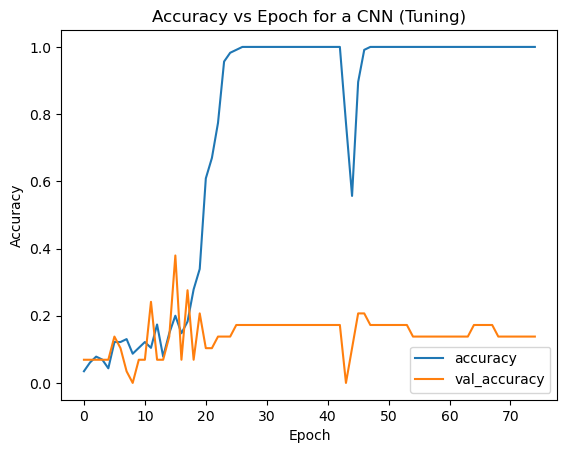

Best epoch: 20, Validation Accuracy: 0.2069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.038
Average Test Recall: 0.042
Average Test F1-score: 0.040
Training model 5...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

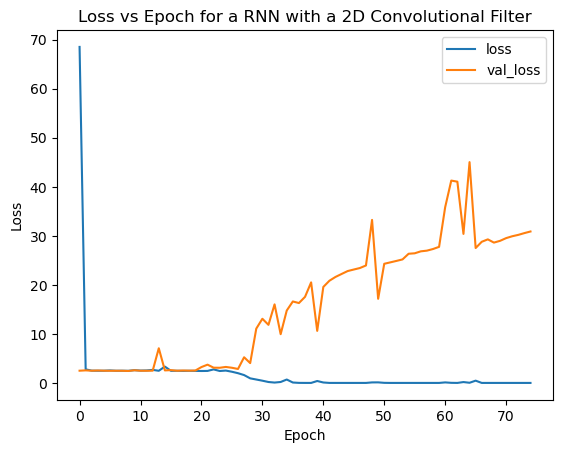

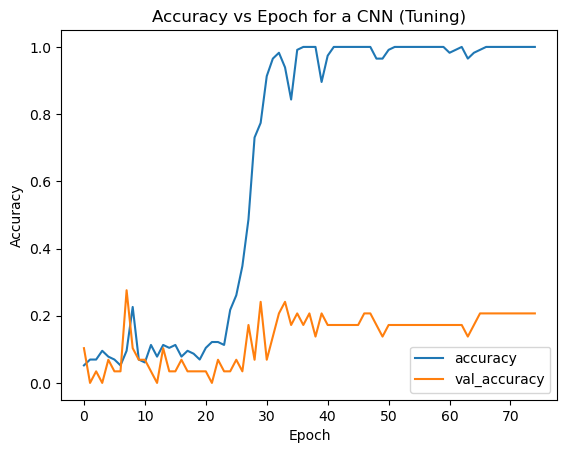

Best epoch: 30, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
Test Accuracy: 20.69%
Average Test Precision: 0.028
Average Test Recall: 0.050
Average Test F1-score: 0.036
Training model 6...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

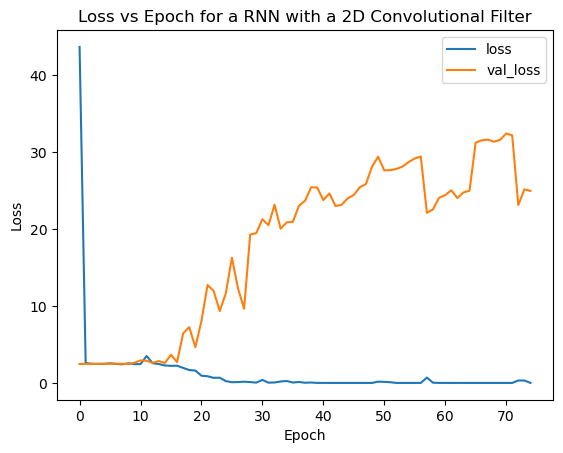

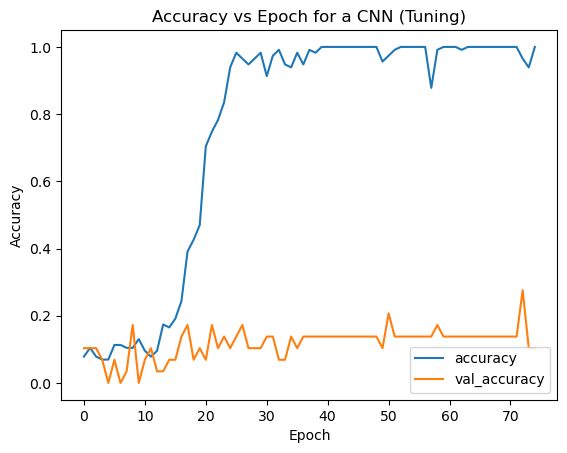

Best epoch: 73, Validation Accuracy: 0.2759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.038
Average Test Recall: 0.042
Average Test F1-score: 0.040
Training model 7...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

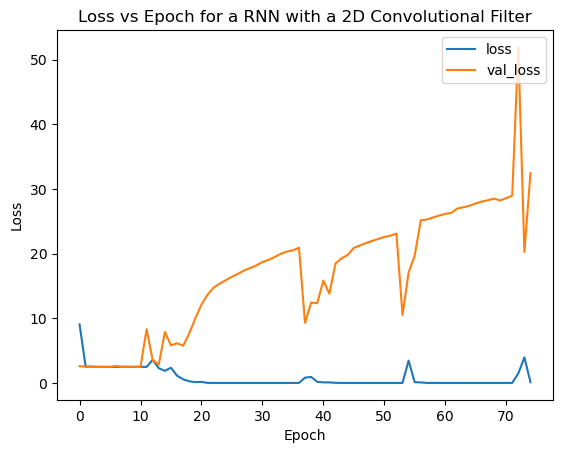

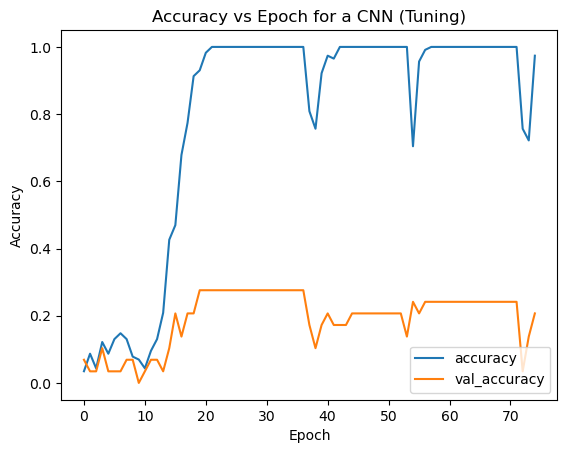

Best epoch: 20, Validation Accuracy: 0.2759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
Test Accuracy: 24.14%
Average Test Precision: 0.099
Average Test Recall: 0.208
Average Test F1-score: 0.132
Training model 8...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

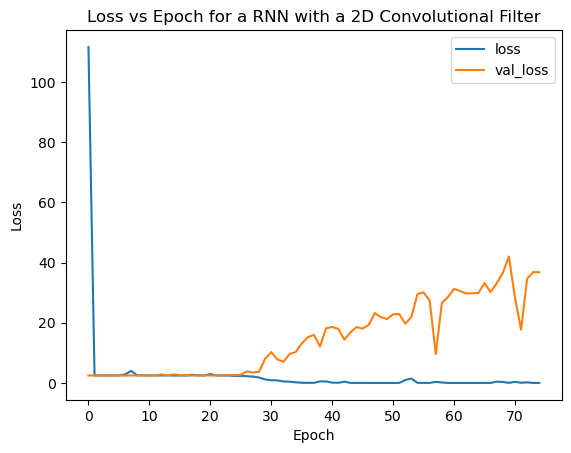

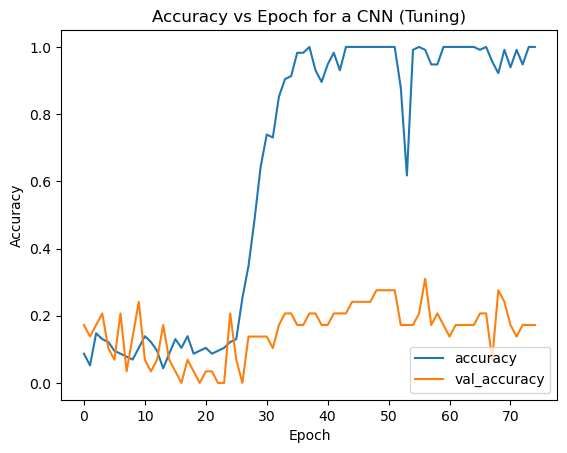

Best epoch: 57, Validation Accuracy: 0.3103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
Test Accuracy: 20.69%
Average Test Precision: 0.156
Average Test Recall: 0.144
Average Test F1-score: 0.111
Training model 9...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

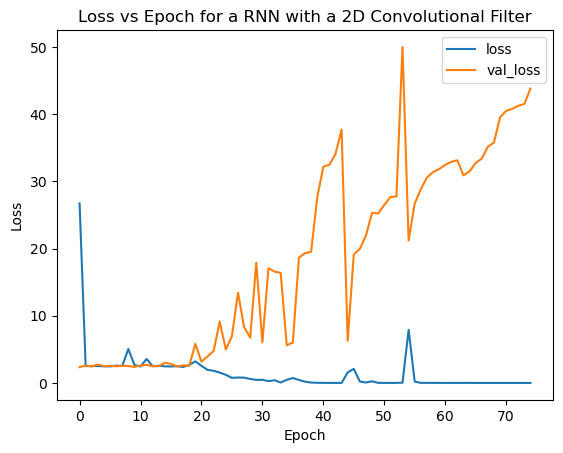

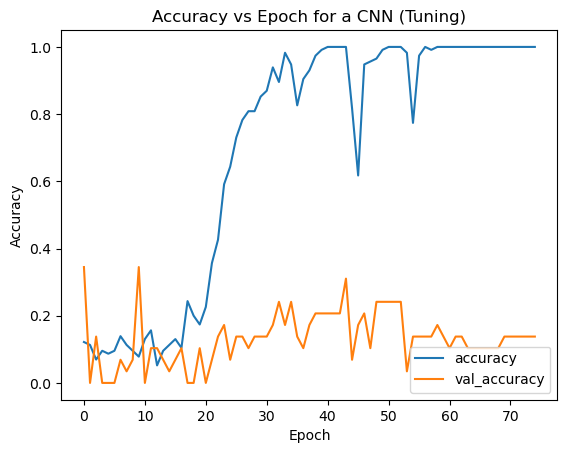

Best epoch: 44, Validation Accuracy: 0.3103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
Test Accuracy: 24.14%
Average Test Precision: 0.039
Average Test Recall: 0.058
Average Test F1-score: 0.047
Training model 10...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

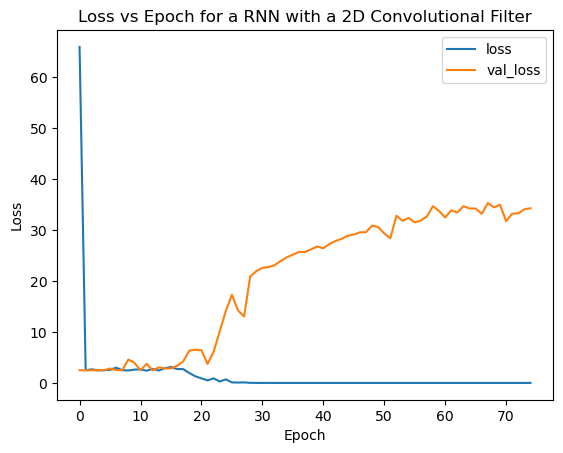

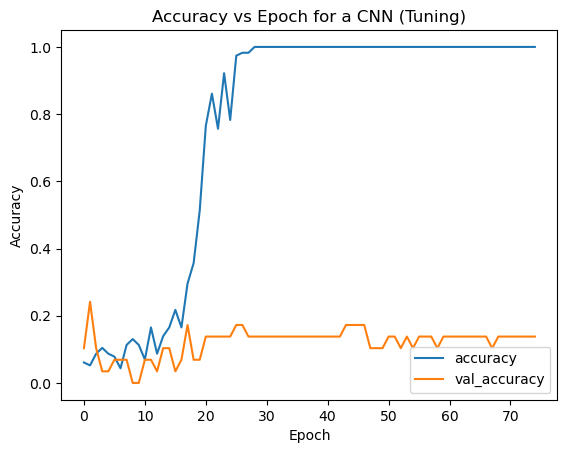

Best epoch: 26, Validation Accuracy: 0.1724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
Test Accuracy: 6.90%
Average Test Precision: 0.022
Average Test Recall: 0.055
Average Test F1-score: 0.023
Training model 11...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


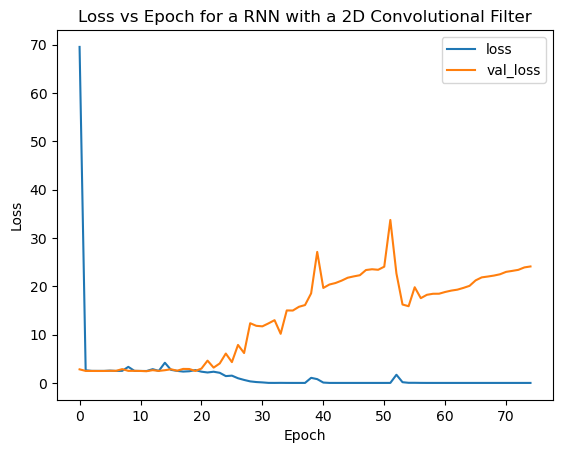

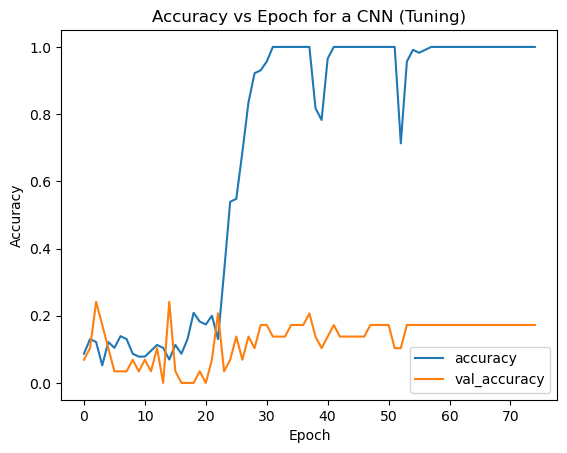

Best epoch: 23, Validation Accuracy: 0.2069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
Test Accuracy: 10.34%
Average Test Precision: 0.025
Average Test Recall: 0.025
Average Test F1-score: 0.025
Training model 12...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

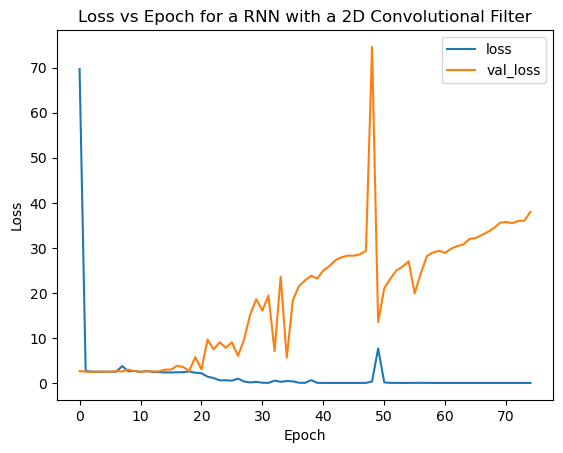

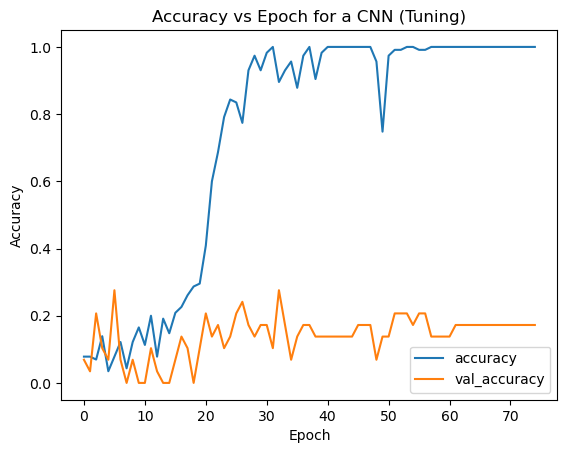

Best epoch: 33, Validation Accuracy: 0.2759
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
Test Accuracy: 24.14%
Average Test Precision: 0.135
Average Test Recall: 0.153
Average Test F1-score: 0.135
Training model 13...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

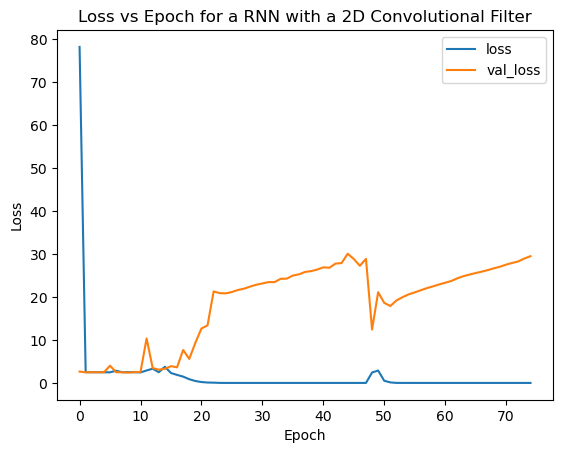

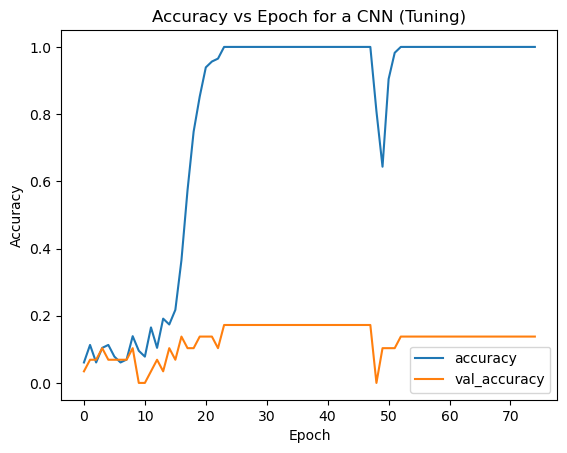

Best epoch: 24, Validation Accuracy: 0.1724
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.047
Average Test Recall: 0.117
Average Test F1-score: 0.057
Training model 14...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

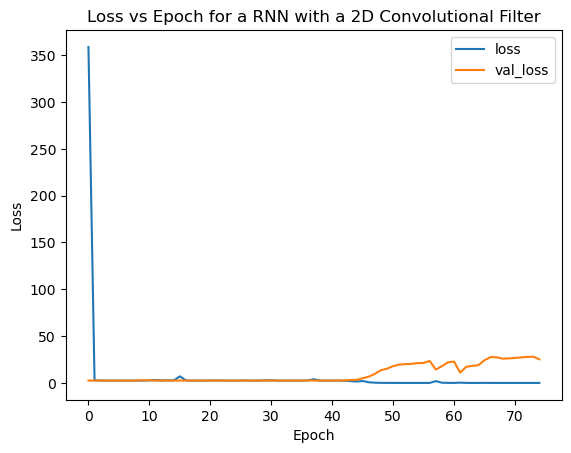

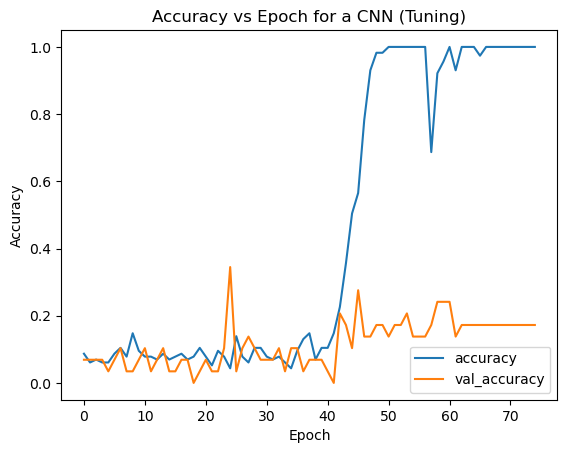

Best epoch: 25, Validation Accuracy: 0.3448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step
Test Accuracy: 3.45%
Average Test Precision: 0.018
Average Test Recall: 0.045
Average Test F1-score: 0.026
Training model 15...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


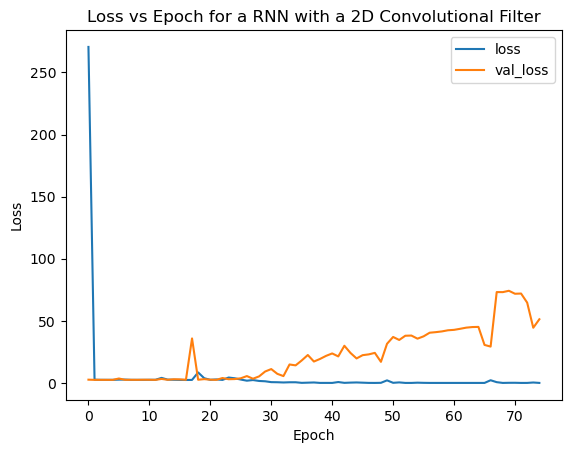

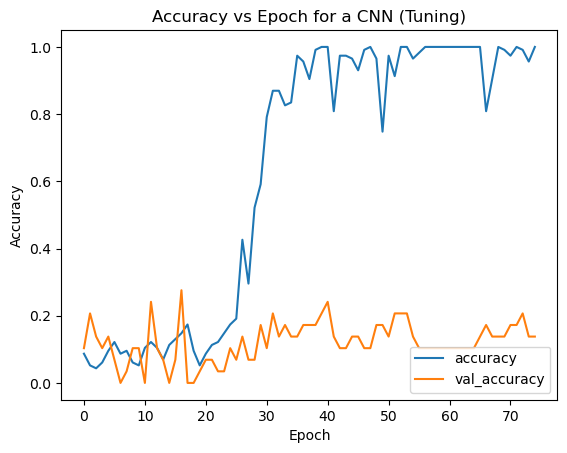

Best epoch: 41, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step
Test Accuracy: 17.24%
Average Test Precision: 0.042
Average Test Recall: 0.042
Average Test F1-score: 0.042
Training model 16...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activit

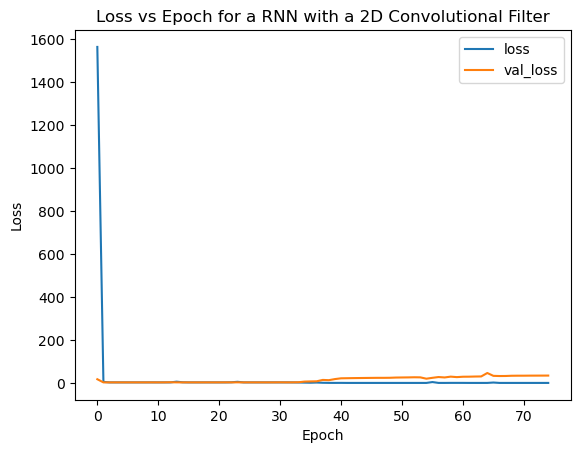

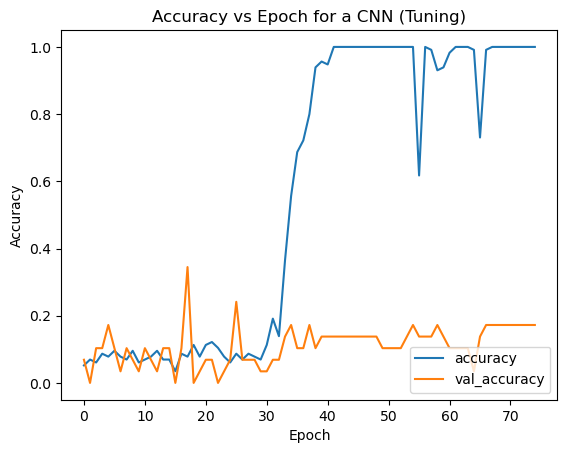

Best epoch: 26, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step
Test Accuracy: 6.90%
Average Test Precision: 0.006
Average Test Recall: 0.091
Average Test F1-score: 0.012
Training model 17...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


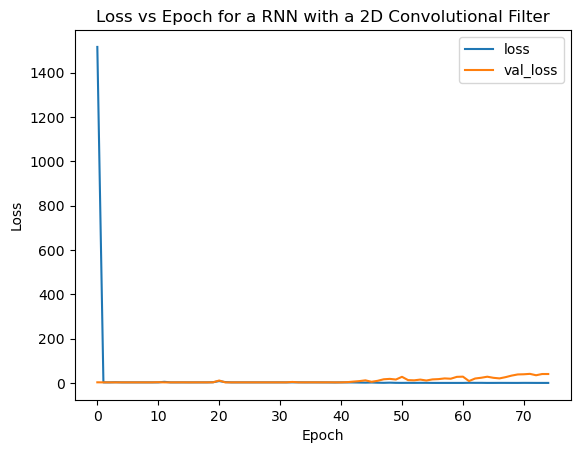

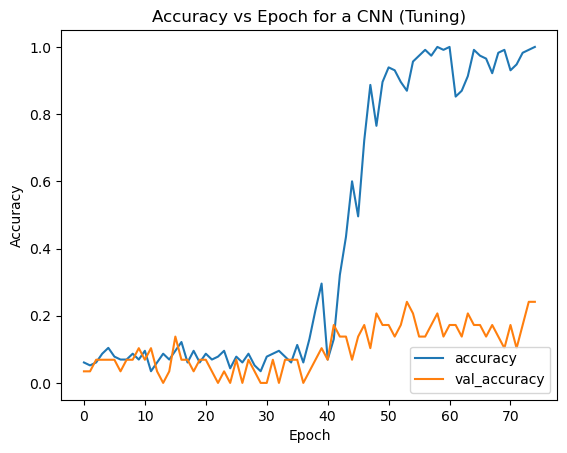

Best epoch: 54, Validation Accuracy: 0.2414
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step
Test Accuracy: 20.69%
Average Test Precision: 0.101
Average Test Recall: 0.097
Average Test F1-score: 0.099
Training model 18...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


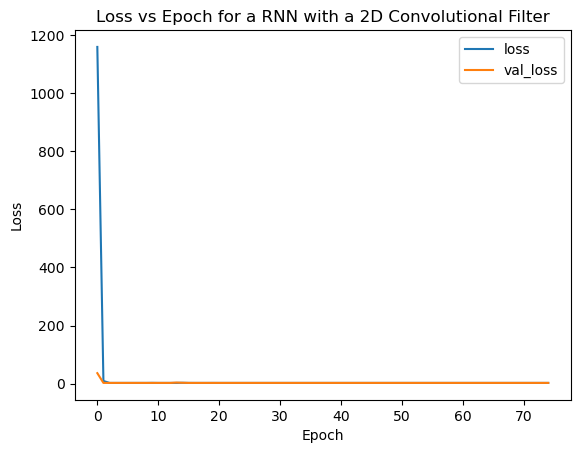

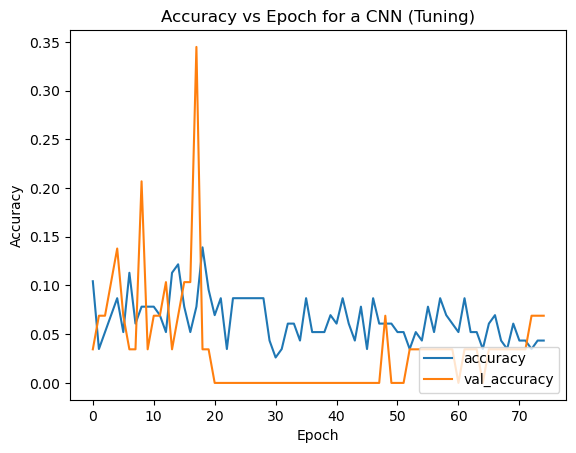

Best epoch: 49, Validation Accuracy: 0.0690
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step
Test Accuracy: 3.45%
Average Test Precision: 0.003
Average Test Recall: 0.091
Average Test F1-score: 0.006
    convolution_width  dropout_rate  starting_filter_cnt  epoch  accuracy  \
0                 3.0           0.1                 16.0     36  0.206897   
1                 3.0           0.3                 16.0     25  0.172414   
2                 3.0           0.5                 16.0     40  0.172414   
3                 5.0           0.1                 16.0     20  0.172414   
4                 5.0           0.3                 16.0     30  0.206897   
5                 5.0           0.5                 16.0     73  0.172414   
6                 7.0           0.1                 16.0     20  0.241379   
7                 7.0           0.3                 16.0     57  0.206897   
8                 7.0           0.5                 16.0     44  0.241379   
9                 3.0           0.1     

c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [89]:
# tuning the 2d convolutional model further, adding an LSTM layer did not work well
conv_shapes = np.array([3, 5, 7])
dropout_rates = np.array([0.1, 0.3, 0.5])
starting_filters = np.array([16, 32])

tune_grid = np.array(np.meshgrid(conv_shapes, dropout_rates, starting_filters)).T.reshape(-1, 3)
print(tune_grid.shape)  # Display first 5 combinations
test_performances = []
for tune_index in range(tune_grid.shape[0]):
    conv_width = int(round(tune_grid[tune_index, 0]))
    dropout_rate = tune_grid[tune_index, 1]
    starting_filters = int(round(tune_grid[tune_index, 2]))
    print(f"Training model {tune_index + 1}...")
    this_model = Sequential(
        [
        Conv2D(filters=starting_filters, kernel_size=(conv_width, conv_width), padding='same', activation='relu', input_shape=(128,517, 1)),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*2, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*3, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*4, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dropout(rate=dropout_rate),
        Dense(units=512, activation='relu'),
        Dense(units=12, activation='softmax') # 12 bird species
        ])

    this_model.compile(loss='categorical_crossentropy',
                optimizer='rmsprop',
                metrics=['accuracy'])
    original_weights = this_model.get_weights()

    this_history = this_model.fit(train_data, train_labels,
                        epochs=75,
                        batch_size=20, #115 training examples
                        validation_data=(test_data, test_labels),
                        verbose=0,
                        class_weight=class_weight_dict)

    # print and save the loss and accuracy plots, and pick the best epoch

    out_dir = os.path.join(os.getcwd(), 'output', 'eda', 'plots')
    plt.plot(this_history.history['loss'])
    plt.plot(this_history.history['val_loss'])
    plt.title('Loss vs Epoch for a RNN with a 2D Convolutional Filter')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['loss', 'val_loss'], loc='upper right')
    plt.savefig(os.path.join(out_dir, f'multiclass_cnn_tune_loss_{tune_index + 1:02d}.png'))
    plt.show()

    plt.plot(this_history.history['accuracy'])
    plt.plot(this_history.history['val_accuracy'])
    plt.title('Accuracy vs Epoch for a CNN (Tuning)')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
    plt.savefig(os.path.join(out_dir, f'multiclass_cnn_tune_accuracy_{tune_index:02d}.png'))
    plt.show()
    
    val_acc = this_history.history['val_accuracy']  # Extract validation accuracy values
    # Get the index of the highest accuracy (epochs start at 1)
    # however, this is not always effective, and based on some exploration and looking at the plots,
    # about 20 epochs does not appear to cause significant overfitting with this data and structure with the maximal parameter configuration.
    # Requiring this minimum avoids cases were a random start or initial fluctuations lead to a very low best epoch
    # that does not reproduce similar results
    best_epoch = np.argmax(val_acc[19:]) + 1 + 19

    print(f'Best epoch: {best_epoch}, Validation Accuracy: {val_acc[best_epoch-1]:.4f}')
    
    # retrain and stop at best epoch from before
    this_model.set_weights(original_weights)
    this_history = this_model.fit(train_data, train_labels,
                        epochs=best_epoch,
                        batch_size=20, #115 training examples
                        validation_data=(test_data, test_labels),
                        verbose=0,
                        class_weight=class_weight_dict)

    this_pred = this_model.predict(test_data)

    y_true_classes = np.argmax(test_labels, axis=1)
    this_pred_classes = np.argmax(this_pred, axis=1)

    test_accuracy = accuracy_score(y_true_classes, this_pred_classes)
    precision, recall, f1, _ = precision_recall_fscore_support(y_true_classes, this_pred_classes, average='macro')

    print(f"Test Accuracy: {test_accuracy*100:.2f}%")
    print(f"Average Test Precision: {precision:.3f}")
    print(f"Average Test Recall: {recall:.3f}")
    print(f"Average Test F1-score: {f1:.3f}")
    test_performances.append({'epoch':best_epoch, 'accuracy':test_accuracy, 'average_precision':precision,
                              'average_recall':recall, 'average_f1':f1})

# save performances and parameters
params_df = pd.DataFrame(tune_grid, columns=['convolution_width', 'dropout_rate', 'starting_filter_cnt'])
results_df = pd.DataFrame(test_performances)
results_df = pd.concat([params_df, results_df], axis=1)
out_dir = os.path.join(os.getcwd(), 'output', 'eda', 'data')
results_df.to_csv(os.path.join(out_dir, 'tune_results_cnn_multiclass.csv'), index=False)
print(results_df)

### binary classification model

Exploration here will also inform the multiclassification model, but may be easier to explore with more examples per response category. This model will attempt to distinguis between the American Robin (amerob) and the Dark-Eyed Junco (daejun)

In [92]:
# Set up eda data
chosen = np.array(["amerob", "daejun"])
binary_data = np.concatenate([birds[key] for key in chosen], axis=-1)
binary_data_labels = np.concatenate([np.full(birds[key].shape[-1], ind) for (ind, key) in enumerate(chosen)])

def binaryLabelsToBirds(labels):
    return chosen[labels]

In [ ]:
# pick a sample for training and validation
n_binary_samples = binary_data.shape[-1]
test_prop = 0.2
train_indices, test_indices = train_test_split(np.arange(0, binary_data.shape[-1]), test_size=test_prop, random_state=112358)

train_data = np.transpose(binary_data[:,:, train_indices], (2, 0, 1)).reshape(-1, 128, 517, 1) # reshape and add single channel for cnn
train_labels = binary_data_labels[train_indices]
train_data, train_labels = shuffle(train_data, train_labels, random_state=112358)
test_data = np.transpose(binary_data[:,:, test_indices], (2, 0, 1)).reshape(-1, 128, 517, 1)
test_labels = binary_data_labels[test_indices]
test_data, test_labels = shuffle(test_data, test_labels, random_state=112358)
print(test_labels.shape)
print(train_labels.shape)
print(test_labels[0])

# create weights for training loss relative to response class imbalance
binary_class_weights = compute_class_weight(class_weight="balanced", 
                                     classes=np.unique(binary_data_labels[train_indices], axis=0), 
                                     y=binary_data_labels[train_indices])
binary_class_weight_dict = {i: binary_class_weights[i] for i in range(len(binary_class_weights))}

print(binary_class_weight_dict)

(60,)
(237,)
0
{0: np.float64(1.0648148148148149), 1: np.float64(1.369047619047619), 2: np.float64(1.1979166666666667), 3: np.float64(1.1979166666666667), 4: np.float64(0.9583333333333334), 5: np.float64(1.369047619047619), 6: np.float64(0.45634920634920634), 7: np.float64(1.0648148148148149), 8: np.float64(1.1979166666666667), 9: np.float64(0.7986111111111112), 10: np.float64(1.1979166666666667), 11: np.float64(1.1979166666666667)}


(18, 3)
Training model 1...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


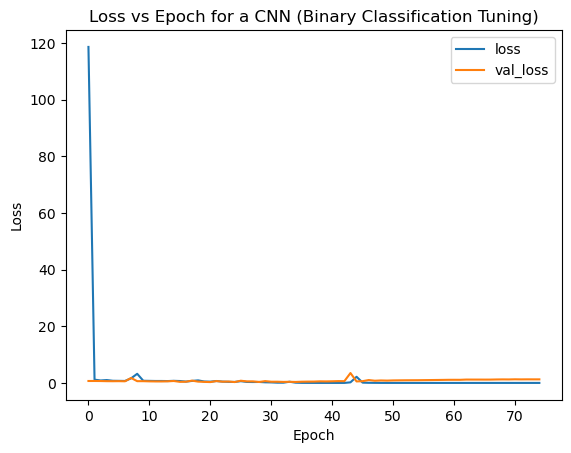

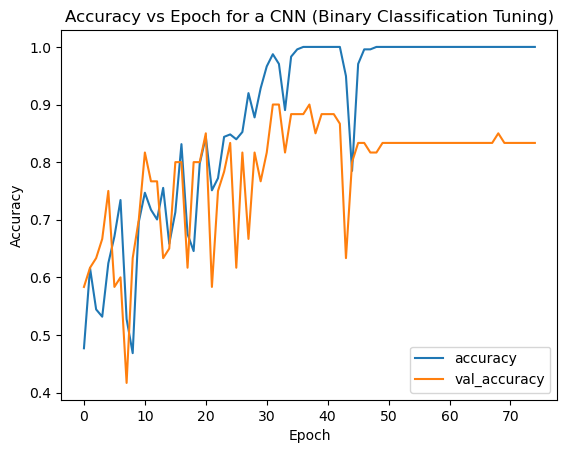

Best epoch: 32, Validation Accuracy: 0.9000
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
Test Accuracy: 83.33%
Average Test Precision: 0.832
Average Test Recall: 0.823
Average Test F1-score: 0.826
Training model 2...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


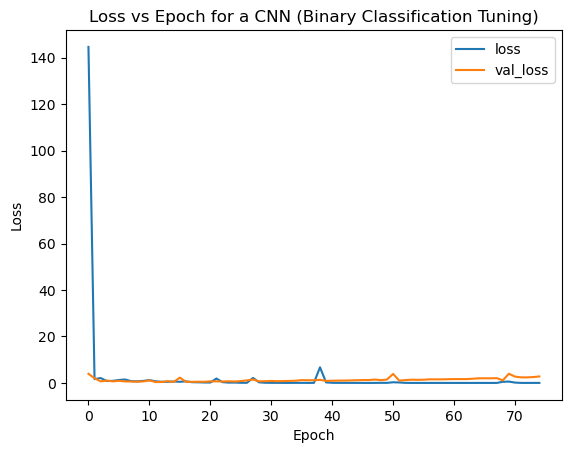

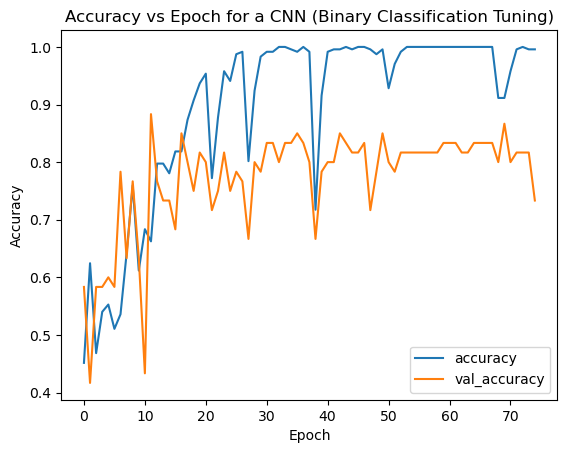

Best epoch: 40, Validation Accuracy: 0.7833
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
Test Accuracy: 81.67%
Average Test Precision: 0.812
Average Test Recall: 0.809
Average Test F1-score: 0.810
Training model 3...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


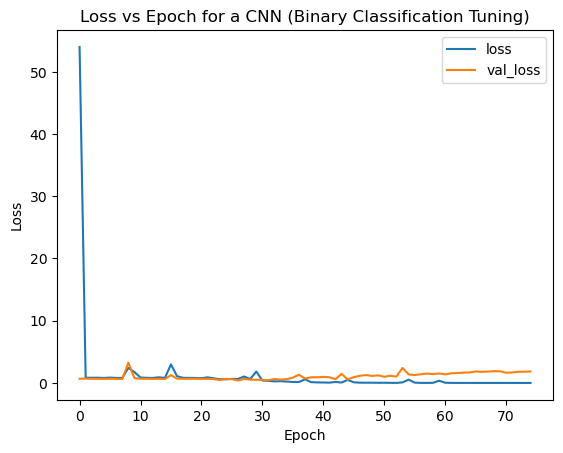

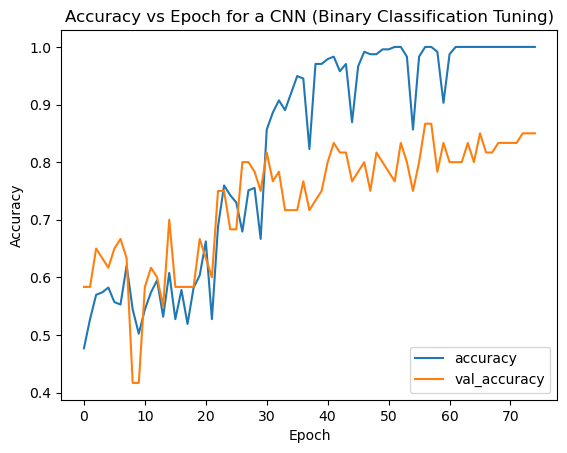

Best epoch: 40, Validation Accuracy: 0.7500
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
Test Accuracy: 81.67%
Average Test Precision: 0.812
Average Test Recall: 0.820
Average Test F1-score: 0.814
Training model 4...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


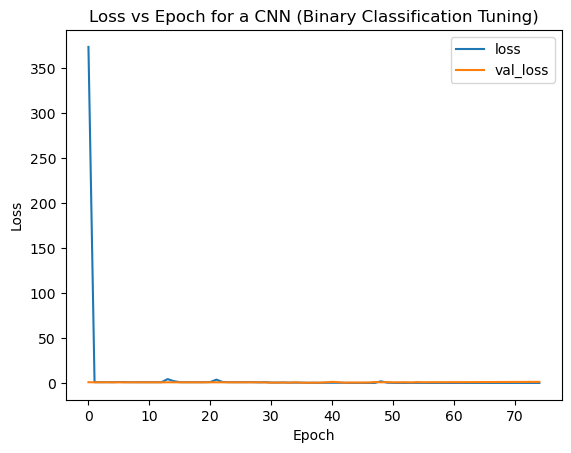

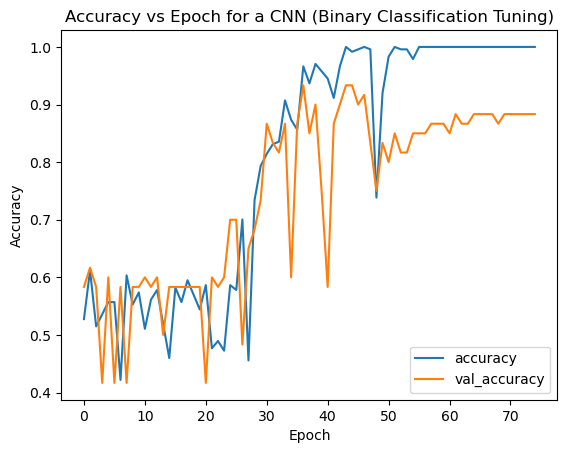

Best epoch: 37, Validation Accuracy: 0.9333
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step
Test Accuracy: 85.00%
Average Test Precision: 0.850
Average Test Recall: 0.860
Average Test F1-score: 0.849
Training model 5...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


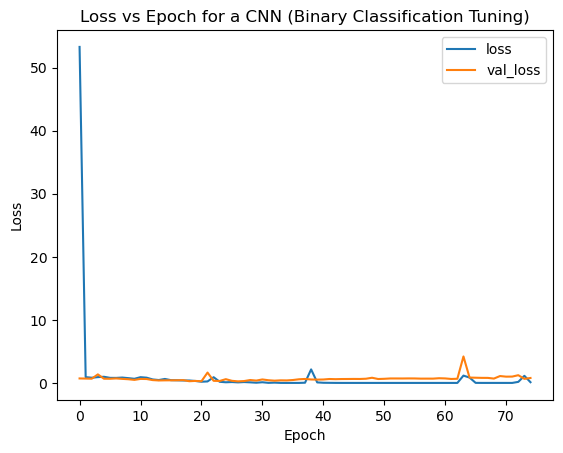

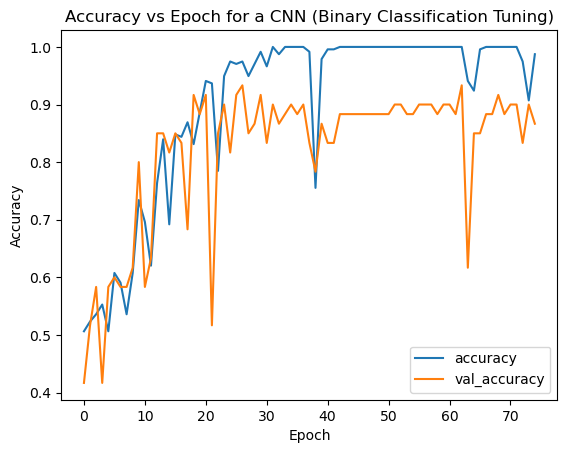

Best epoch: 27, Validation Accuracy: 0.9333
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step
Test Accuracy: 86.67%
Average Test Precision: 0.864
Average Test Recall: 0.874
Average Test F1-score: 0.865
Training model 6...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


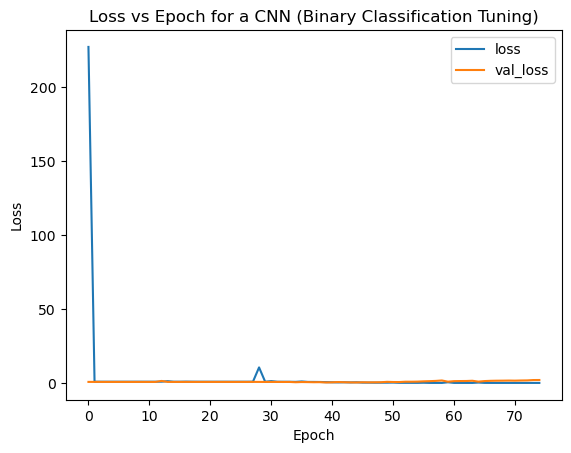

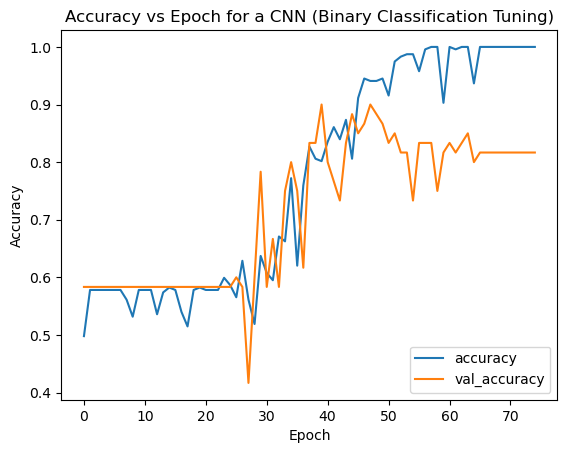

Best epoch: 40, Validation Accuracy: 0.9000
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step
Test Accuracy: 71.67%
Average Test Precision: 0.775
Average Test Recall: 0.751
Average Test F1-score: 0.715
Training model 7...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


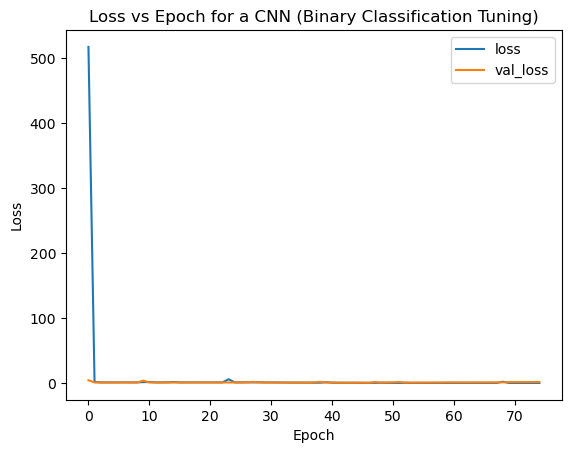

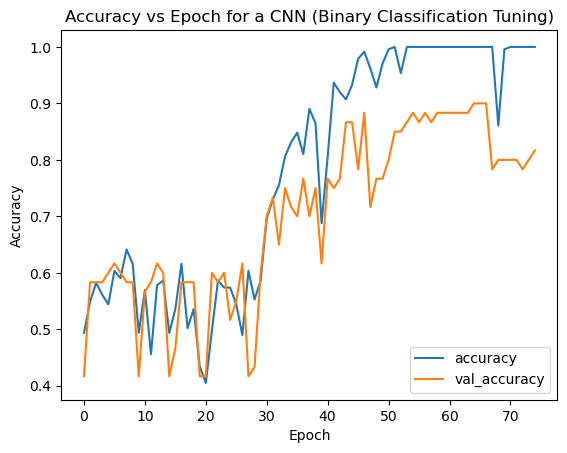

Best epoch: 40, Validation Accuracy: 0.6167
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 349ms/step
Test Accuracy: 95.00%
Average Test Precision: 0.947
Average Test Recall: 0.951
Average Test F1-score: 0.949
Training model 8...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


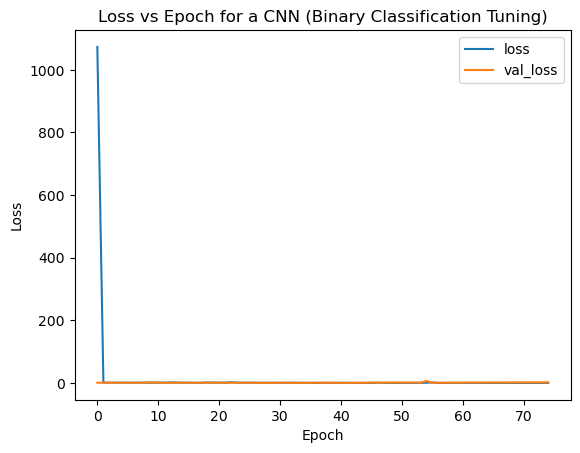

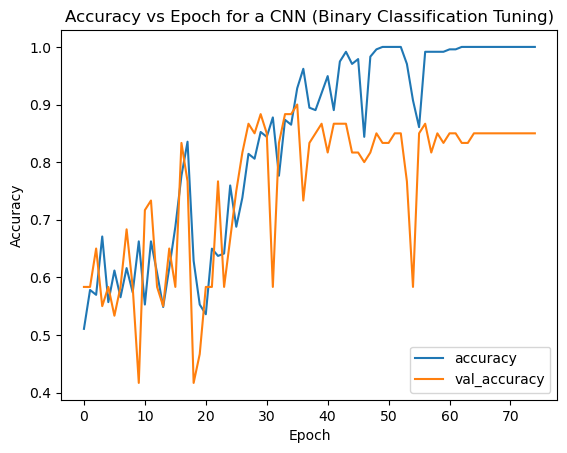

Best epoch: 36, Validation Accuracy: 0.9000
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step
Test Accuracy: 85.00%
Average Test Precision: 0.846
Average Test Recall: 0.854
Average Test F1-score: 0.848
Training model 9...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


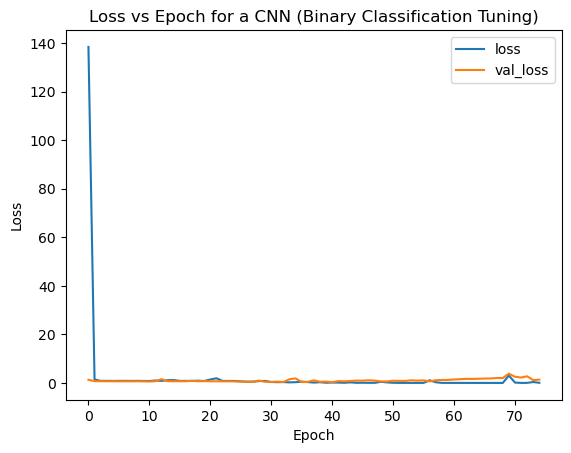

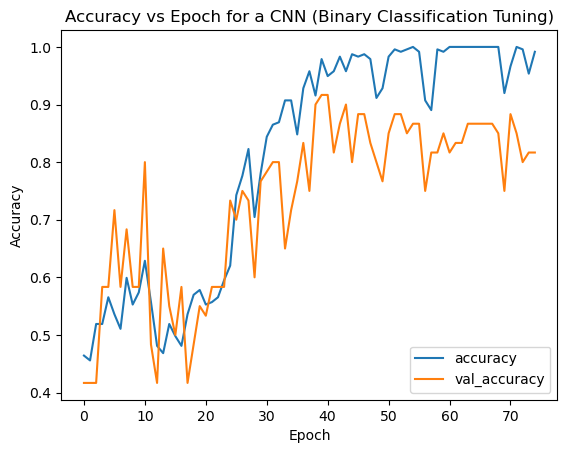

Best epoch: 40, Validation Accuracy: 0.9167
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 307ms/step
Test Accuracy: 85.00%
Average Test Precision: 0.846
Average Test Recall: 0.854
Average Test F1-score: 0.848
Training model 10...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


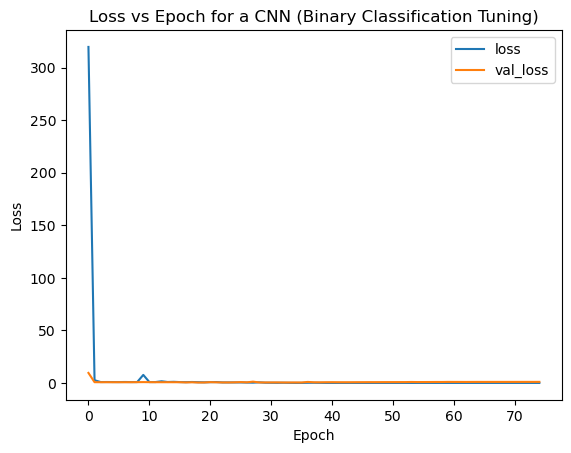

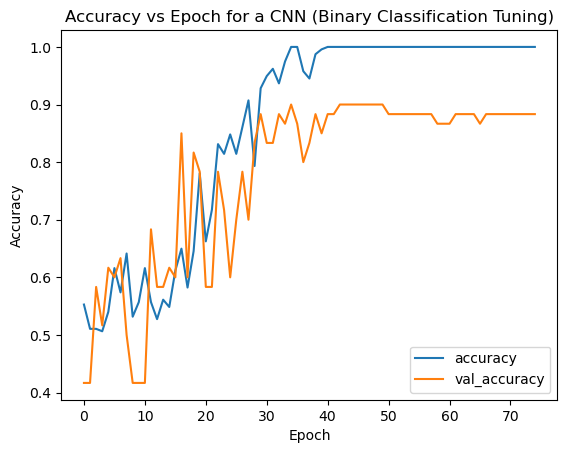

Best epoch: 35, Validation Accuracy: 0.9000
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 296ms/step
Test Accuracy: 80.00%
Average Test Precision: 0.823
Average Test Recall: 0.823
Average Test F1-score: 0.800
Training model 11...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


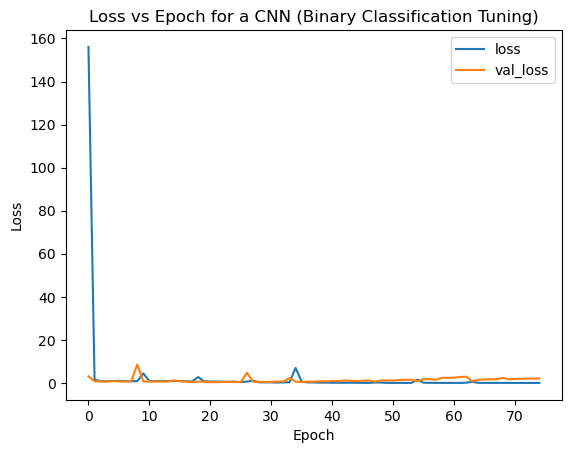

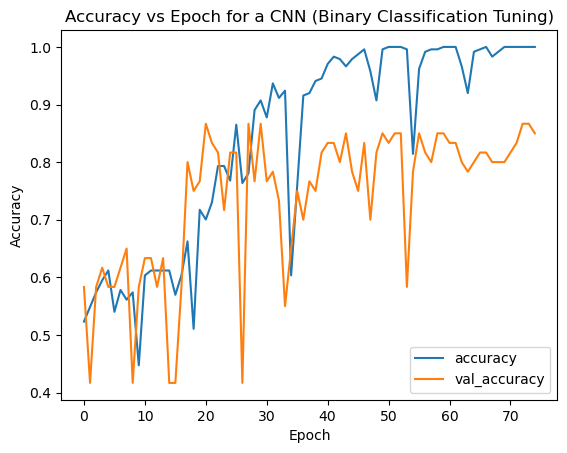

Best epoch: 21, Validation Accuracy: 0.8667
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 319ms/step
Test Accuracy: 60.00%
Average Test Precision: 0.797
Average Test Recall: 0.520
Average Test F1-score: 0.411
Training model 12...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


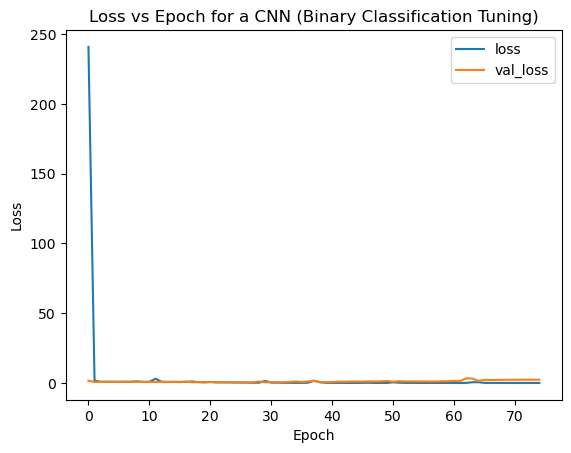

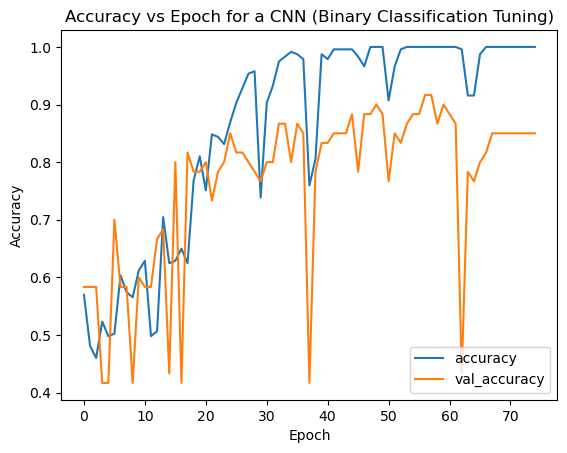

Best epoch: 40, Validation Accuracy: 0.8333
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step
Test Accuracy: 81.67%
Average Test Precision: 0.824
Average Test Recall: 0.831
Average Test F1-score: 0.816
Training model 13...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


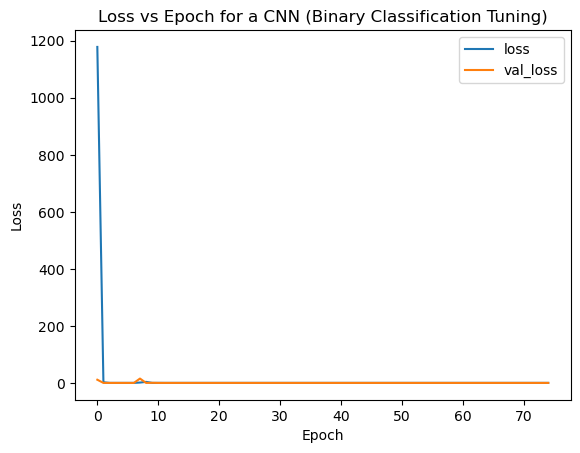

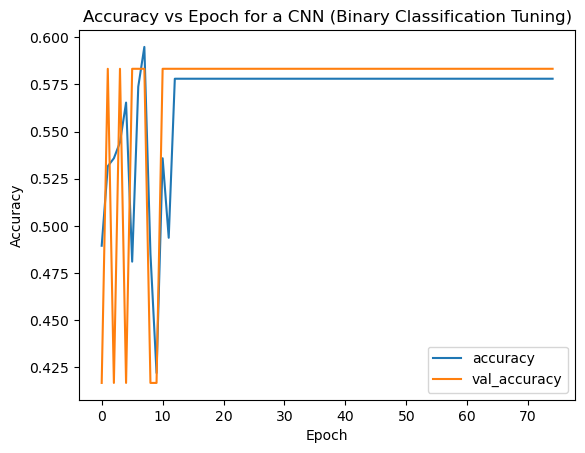

Best epoch: 20, Validation Accuracy: 0.5833
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
Test Accuracy: 41.67%
Average Test Precision: 0.208
Average Test Recall: 0.500
Average Test F1-score: 0.294
Training model 14...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


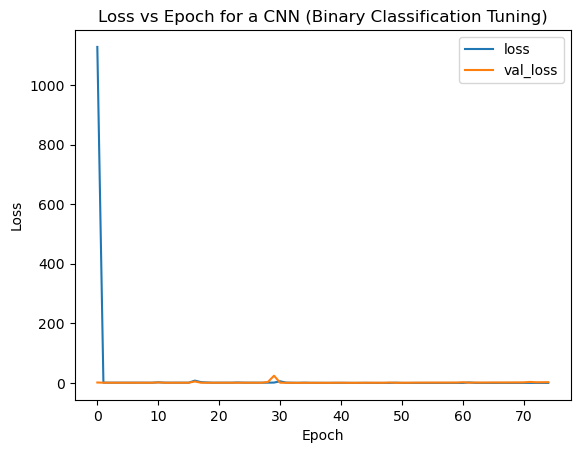

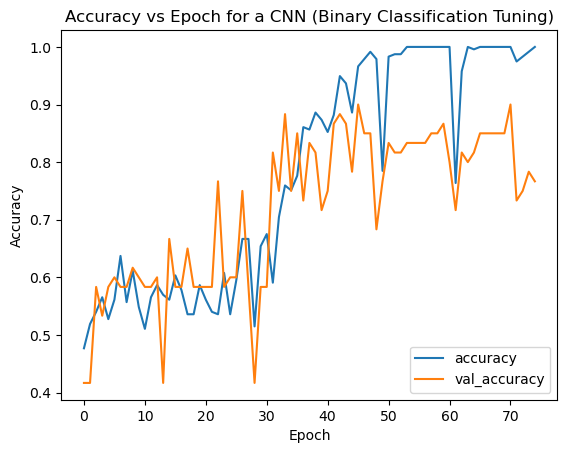

Best epoch: 40, Validation Accuracy: 0.7167
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 473ms/step
Test Accuracy: 80.00%
Average Test Precision: 0.795
Average Test Recall: 0.800
Average Test F1-score: 0.796
Training model 15...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


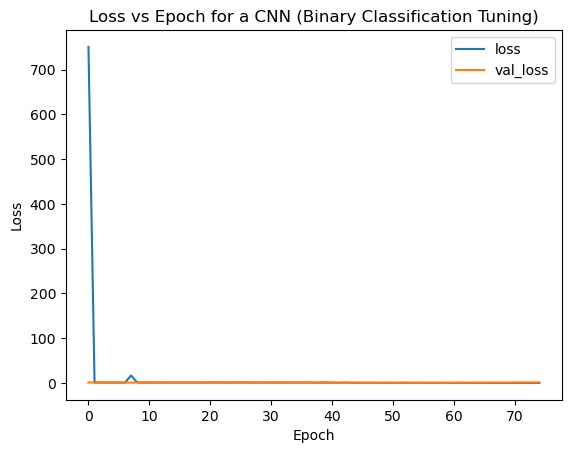

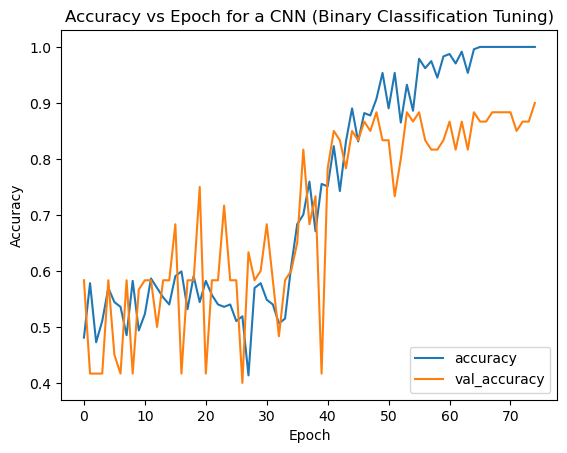

Best epoch: 40, Validation Accuracy: 0.4167
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
Test Accuracy: 80.00%
Average Test Precision: 0.795
Average Test Recall: 0.800
Average Test F1-score: 0.796
Training model 16...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


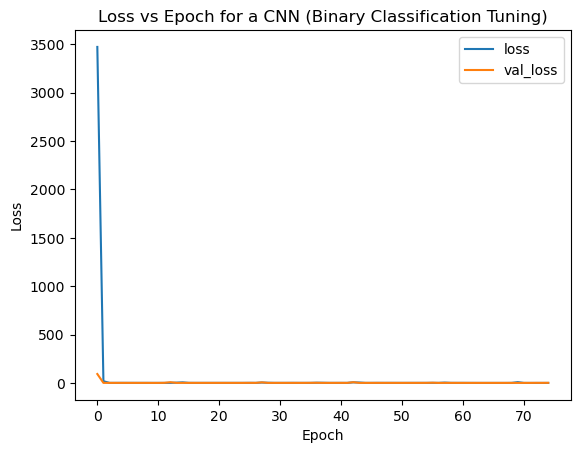

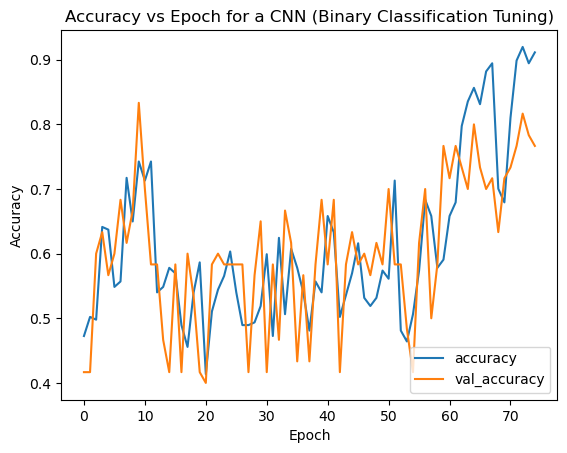

Best epoch: 40, Validation Accuracy: 0.6833
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 798ms/step
Test Accuracy: 86.67%
Average Test Precision: 0.862
Average Test Recall: 0.869
Average Test F1-score: 0.864
Training model 17...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


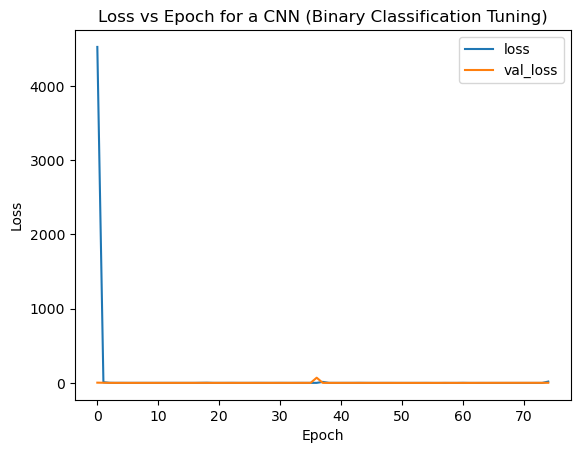

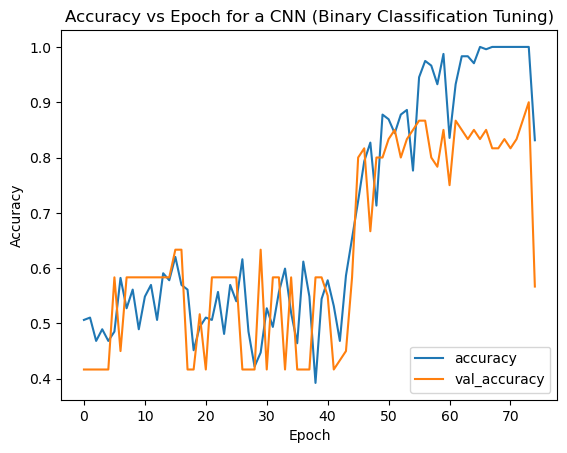

Best epoch: 40, Validation Accuracy: 0.5833
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 743ms/step
Test Accuracy: 83.33%
Average Test Precision: 0.831
Average Test Recall: 0.840
Average Test F1-score: 0.832
Training model 18...


c:\Users\ellin\miniconda3\envs\keras_dl\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


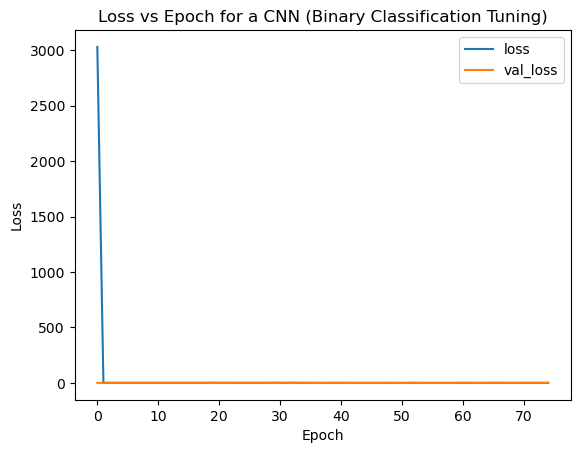

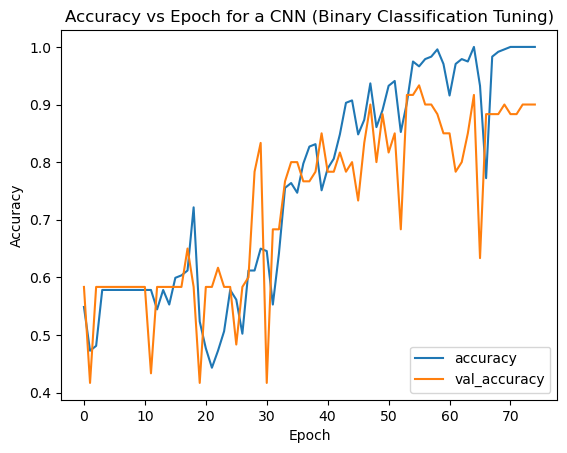

Best epoch: 40, Validation Accuracy: 0.8500
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 742ms/step
Test Accuracy: 60.00%
Average Test Precision: 0.797
Average Test Recall: 0.520
Average Test F1-score: 0.411
    convolution_width  dropout_rate  starting_filter_cnt  epoch  accuracy  \
0                 3.0           0.1                 16.0     32  0.833333   
1                 3.0           0.3                 16.0     40  0.816667   
2                 3.0           0.5                 16.0     40  0.816667   
3                 5.0           0.1                 16.0     37  0.850000   
4                 5.0           0.3                 16.0     27  0.866667   
5                 5.0           0.5                 16.0     40  0.716667   
6                 7.0           0.1                 16.0     40  0.950000   
7                 7.0           0.3                 16.0     36  0.850000   
8                 7.0           0.5                 16.0     40  0.850000   
9                 3.0           0.1    

In [ ]:
# tuning the 2d convolutional model
conv_shapes = np.array([3, 5, 7])
dropout_rates = np.array([0.1, 0.3, 0.5])
starting_filters = np.array([16, 32])
batch_size = 40 # splits ~240 training samples nicely
tune_grid = np.array(np.meshgrid(conv_shapes, dropout_rates, starting_filters)).T.reshape(-1, 3)
print(tune_grid.shape) 
binary_test_performances = []
for tune_index in range(tune_grid.shape[0]):
    conv_width = int(round(tune_grid[tune_index, 0]))
    dropout_rate = tune_grid[tune_index, 1]
    starting_filters = int(round(tune_grid[tune_index, 2]))
    print(f"Training model {tune_index + 1}...")
    this_model = Sequential(
        [
        Conv2D(filters=starting_filters, kernel_size=(conv_width, conv_width), padding='same', activation='relu', input_shape=(128,517, 1)),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*2, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*3, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Conv2D(filters=starting_filters*4, kernel_size=(conv_width, conv_width), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2,2)),
        Flatten(),
        Dropout(rate=dropout_rate),
        Dense(units=512, activation='relu'),
        Dense(units=1, activation='sigmoid')
        ])

    this_model.compile(loss='binary_crossentropy',
                optimizer='rmsprop',
                metrics=['accuracy'])
    original_weights = this_model.get_weights()

    this_history = this_model.fit(train_data, train_labels,
                        epochs=75,
                        batch_size=batch_size,
                        validation_data=(test_data, test_labels),
                        verbose=0,
                        class_weight=binary_class_weight_dict)

    # print and save the loss and accuracy plots, and attempt to pick the best epoch

    out_dir = os.path.join(os.getcwd(), 'output', 'eda', 'plots')
    plt.plot(this_history.history['loss'])
    plt.plot(this_history.history['val_loss'])
    plt.title('Loss vs Epoch for a CNN (Binary Classification Tuning)')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['loss', 'val_loss'], loc='upper right')
    plt.savefig(os.path.join(out_dir, f'binary_cnn_tune_loss_{tune_index + 1:02d}.png'))
    plt.show()

    plt.plot(this_history.history['accuracy'])
    plt.plot(this_history.history['val_accuracy'])
    plt.title('Accuracy vs Epoch for a CNN (Binary Classification Tuning)')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['accuracy', 'val_accuracy'], loc='lower right')
    plt.savefig(os.path.join(out_dir, f'binary_cnn_tune_accuracy_{tune_index:02d}.png'))
    plt.show()
    
    val_acc = this_history.history['val_accuracy']  # Extract validation accuracy values
    # Get the index of the highest accuracy (epochs start at 1)
    # however, this is not always effective, and based on some exploration and looking at the plots,
    # about 20 epochs does not appear to cause significant overfitting with this data and structure with the maximal parameter configuration.
    # Requiring this minimum avoids cases were a random start or initial fluctuations lead to a very low best epoch
    # that does not reproduce similar results
    # beyond 4 in most of the versions seen so far tends to begin overfitting
    # since this is not entirely reliable, the primary way to compare hyperparameter sets is the accuracy plots
    best_epoch = min(np.argmax(val_acc[19:]) + 1 + 19, 40)

    print(f'Best epoch: {best_epoch}, Validation Accuracy: {val_acc[best_epoch-1]:.4f}')
    
    # retrain and stop at best epoch from before
    this_model.set_weights(original_weights)
    this_history = this_model.fit(train_data, train_labels,
                        epochs=best_epoch,
                        batch_size=40,
                        validation_data=(test_data, test_labels),
                        verbose=0,
                        class_weight=class_weight_dict)

    this_pred = (this_model.predict(test_data) > 0.5)

    test_accuracy = accuracy_score(test_labels, this_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(test_labels, this_pred, average='macro')

    print(f"Test Accuracy: {test_accuracy*100:.2f}%")
    print(f"Average Test Precision: {precision:.3f}")
    print(f"Average Test Recall: {recall:.3f}")
    print(f"Average Test F1-score: {f1:.3f}")
    binary_test_performances.append({'epoch':best_epoch, 'accuracy':test_accuracy, 'average_precision':precision,
                              'average_recall':recall, 'average_f1':f1})

# save performances and parameters
binary_params_df = pd.DataFrame(tune_grid, columns=['convolution_width', 'dropout_rate', 'starting_filter_cnt'])
binary_results_df = pd.DataFrame(binary_test_performances)
binary_results_df = pd.concat([binary_params_df, binary_results_df], axis=1)
out_dir = os.path.join(os.getcwd(), 'output', 'eda', 'data')
binary_results_df.to_csv(os.path.join(out_dir, 'tune_results_cnn_binary.csv'), index=False)
print(binary_results_df)